# 0.Preparation

## 0.1 Install Yolo

In [ ]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.3/41.3 kB 2.7 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.

## 0.2 Connecet colab

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Copy Kaggle API key to Colab Runtime

In [ ]:
!mkdir ~/.kaggle
!cp /content/drive/MyDrive/AI_Project/kaggle.json ~/.kaggle/     # แก้ไข Path ของ file kaggle
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets download swapnilnaique/tomato-data

Dataset URL: https://www.kaggle.com/datasets/swapnilnaique/tomato-data
License(s): CC-BY-NC-SA-4.0
 99% 825M/831M [00:12<00:00, 77.1MB/s]
100% 831M/831M [00:12<00:00, 70.1MB/s]


In [ ]:
!unzip /content/tomato-data.zip

Archive:  /content/tomato-data.zip
  inflating: Data/Test/Ripe/IMG_0986.jpg  
  inflating: Data/Test/Ripe/IMG_0987.jpg  
  inflating: Data/Test/Ripe/IMG_0991.jpg  
  inflating: Data/Test/Ripe/IMG_1024.jpg  
  inflating: Data/Test/Ripe/IMG_1029.jpg  
  inflating: Data/Test/Ripe/IMG_1030.jpg  
  inflating: Data/Test/Ripe/IMG_1059.jpg  
  inflating: Data/Test/Ripe/IMG_1085.jpg  
  inflating: Data/Test/Ripe/IMG_1095.jpg  
  inflating: Data/Test/Ripe/IMG_1097.jpg  
  inflating: Data/Test/Ripe/IMG_1103.jpg  
  inflating: Data/Test/Ripe/IMG_1128.jpg  
  inflating: Data/Test/Ripe/IMG_1134.jpg  
  inflating: Data/Test/Ripe/IMG_1161.jpg  
  inflating: Data/Test/Ripe/IMG_1173.jpg  
  inflating: Data/Test/Ripe/IMG_1222.jpg  
  inflating: Data/Test/Ripe/IMG_1224.jpg  
  inflating: Data/Test/Ripe/IMG_1240.jpg  
  inflating: Data/Test/Ripe/IMG_1252.jpg  
  inflating: Data/Test/Ripe/IMG_1255.jpg  
  inflating: Data/Test/Ripe/IMG_1277.jpg  
  inflating: Data/Test/Ripe/IMG_20191215_110517.jpg  
  inflat

In [ ]:
import os
import glob

# Path to the main directory
main_dir = '/content/Data'

# Get list of all .jpg files in directory and subdirectories
jpg_files = glob.glob(os.path.join(main_dir, '**', '*.jpg'), recursive=True)

In [ ]:
len(jpg_files)

439

In [ ]:
jpg_files[:10]

['/content/Data/Test/Ripe/IMG_1161.jpg',
 '/content/Data/Test/Ripe/IMG_20191215_111318.jpg',
 '/content/Data/Test/Ripe/IMG_1224.jpg',
 '/content/Data/Test/Ripe/IMG_20191215_112519.jpg',
 '/content/Data/Test/Ripe/IMG_1029.jpg',
 '/content/Data/Test/Ripe/IMG_20191215_110820.jpg',
 '/content/Data/Test/Ripe/IMG_0991.jpg',
 '/content/Data/Test/Ripe/IMG_1277.jpg',
 '/content/Data/Test/Ripe/IMG_20191215_110517.jpg',
 '/content/Data/Test/Ripe/IMG_20191215_112843.jpg']

## 0.2 Load Yolo weigth

Copy weigth from Drive to Colab

In [ ]:
!cp /content/drive/MyDrive/AI_Project/Tomato/kaggle_best.pt .

In [ ]:
from ultralytics import YOLO

model = YOLO('/content/kaggle_best.pt')

In [ ]:
model.names

{0: 'unripe', 1: 'ripe'}

# 1.ทดลอง inference

In [ ]:
result = model(jpg_files[0])


image 1/1 /content/Data/Test/Ripe/IMG_1161.jpg: 640x480 1 unripe, 2 ripes, 138.3ms
Speed: 13.1ms preprocess, 138.3ms inference, 155.7ms postprocess per image at shape (1, 3, 640, 480)


In [ ]:
result

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'unripe', 1: 'ripe'}
 obb: None
 orig_img: array([[[170, 189, 180],
         [172, 189, 180],
         [173, 187, 181],
         ...,
         [206, 218, 218],
         [207, 219, 219],
         [208, 220, 220]],
 
        [[170, 189, 180],
         [172, 189, 180],
         [172, 186, 180],
         ...,
         [206, 218, 218],
         [207, 219, 219],
         [207, 219, 219]],
 
        [[172, 189, 180],
         [171, 188, 179],
         [170, 184, 178],
         ...,
         [206, 218, 218],
         [207, 219, 219],
         [207, 219, 219]],
 
        ...,
 
        [[ 37,  44,  41],
         [ 38,  45,  42],
         [ 37,  44,  41],
         ...,
         [ 92,  94,  88],
         [ 91,  93,  87],
         [ 91,  93,  87]],
 
        [[ 39,  46,  43],
         [ 40,  47,  44],
         [ 38,  45,  42],
         ...,
       

In [ ]:
result[0].boxes

ultralytics.engine.results.Boxes object with attributes:

cls: tensor([1., 1., 0.], device='cuda:0')
conf: tensor([0.9229, 0.8941, 0.4198], device='cuda:0')
data: tensor([[1.1560e+03, 2.8648e+03, 1.9319e+03, 3.7148e+03, 9.2289e-01, 1.0000e+00],
        [1.1722e+03, 1.7889e+03, 1.9271e+03, 2.4996e+03, 8.9406e-01, 1.0000e+00],
        [1.0502e+03, 3.8011e+03, 1.3144e+03, 4.0298e+03, 4.1983e-01, 0.0000e+00]], device='cuda:0')
id: None
is_track: False
orig_shape: (4032, 3024)
shape: torch.Size([3, 6])
xywh: tensor([[1543.9247, 3289.7974,  775.9236,  850.0613],
        [1549.6218, 2144.2224,  754.8844,  710.7032],
        [1182.2825, 3915.4363,  264.1683,  228.6772]], device='cuda:0')
xywhn: tensor([[0.5106, 0.8159, 0.2566, 0.2108],
        [0.5124, 0.5318, 0.2496, 0.1763],
        [0.3910, 0.9711, 0.0874, 0.0567]], device='cuda:0')
xyxy: tensor([[1155.9629, 2864.7668, 1931.8865, 3714.8281],
        [1172.1797, 1788.8707, 1927.0641, 2499.5740],
        [1050.1982, 3801.0977, 1314.3666, 4029

In [ ]:
result[0].boxes.xyxy

tensor([[1155.9629, 2864.7668, 1931.8865, 3714.8281],
        [1172.1797, 1788.8707, 1927.0641, 2499.5740],
        [1050.1982, 3801.0977, 1314.3666, 4029.7749]], device='cuda:0')

In [ ]:
result[0].boxes.data

tensor([[1.1560e+03, 2.8648e+03, 1.9319e+03, 3.7148e+03, 9.2289e-01, 1.0000e+00],
        [1.1722e+03, 1.7889e+03, 1.9271e+03, 2.4996e+03, 8.9406e-01, 1.0000e+00],
        [1.0502e+03, 3.8011e+03, 1.3144e+03, 4.0298e+03, 4.1983e-01, 0.0000e+00]], device='cuda:0')

## 1.1 show image with bboxs

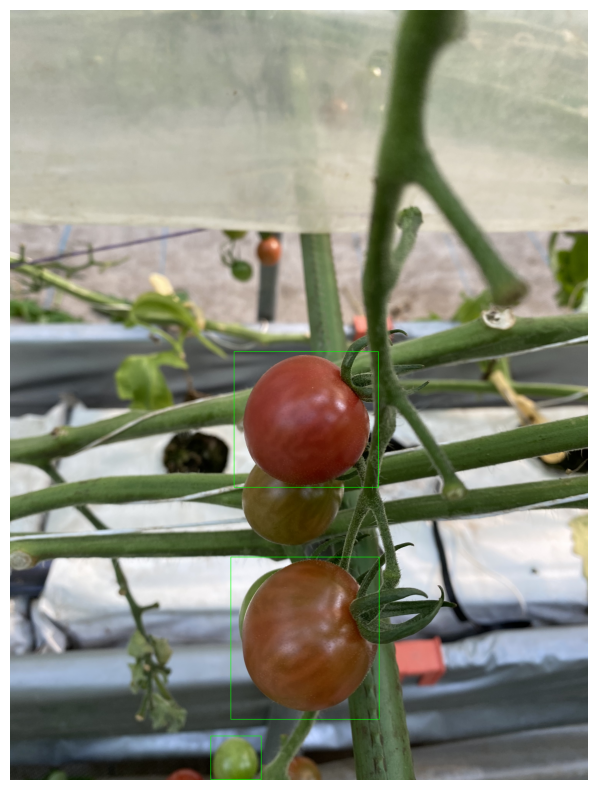

In [ ]:
import cv2
import numpy as np
import torch
import matplotlib.pyplot as plt

# Example image path and bounding box tensor
image_path = jpg_files[0]  # Change this to your image path
xyxy = result[0].boxes.xyxy

# Load the image
image = cv2.imread(image_path)

# Convert tensor to numpy array (move tensor to CPU first)
bboxes = xyxy.squeeze(0).cpu().numpy()

# Draw bounding boxes on the image
for bbox in bboxes:
    # Coordinates in the format (x1, y1, x2, y2)
    x1, y1, x2, y2 = map(int, bbox)
    # Draw a rectangle on the image
    cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)

# Convert BGR image to RGB
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Display the image using matplotlib
plt.figure(figsize=(10, 10))
plt.imshow(image_rgb)
plt.axis('off')  # Hide axes
plt.show()


In [ ]:
result[0].boxes

ultralytics.engine.results.Boxes object with attributes:

cls: tensor([1., 1., 0.], device='cuda:0')
conf: tensor([0.9229, 0.8941, 0.4198], device='cuda:0')
data: tensor([[1.1560e+03, 2.8648e+03, 1.9319e+03, 3.7148e+03, 9.2289e-01, 1.0000e+00],
        [1.1722e+03, 1.7889e+03, 1.9271e+03, 2.4996e+03, 8.9406e-01, 1.0000e+00],
        [1.0502e+03, 3.8011e+03, 1.3144e+03, 4.0298e+03, 4.1983e-01, 0.0000e+00]], device='cuda:0')
id: None
is_track: False
orig_shape: (4032, 3024)
shape: torch.Size([3, 6])
xywh: tensor([[1543.9247, 3289.7974,  775.9236,  850.0613],
        [1549.6218, 2144.2224,  754.8844,  710.7032],
        [1182.2825, 3915.4363,  264.1683,  228.6772]], device='cuda:0')
xywhn: tensor([[0.5106, 0.8159, 0.2566, 0.2108],
        [0.5124, 0.5318, 0.2496, 0.1763],
        [0.3910, 0.9711, 0.0874, 0.0567]], device='cuda:0')
xyxy: tensor([[1155.9629, 2864.7668, 1931.8865, 3714.8281],
        [1172.1797, 1788.8707, 1927.0641, 2499.5740],
        [1050.1982, 3801.0977, 1314.3666, 4029

In [ ]:
##Make  function to display image

In [ ]:
def plot_prediction_image(image_path):
    result = model(image_path)
    xyxy = result[0].boxes.xyxy
    image = cv2.imread(image_path)
    bboxes = xyxy.squeeze(0).cpu().numpy()
    for bbox in bboxes:
        x1, y1, x2, y2 = map(int, bbox)
        cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)

    # Convert BGR image to RGB
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(10, 10))
    plt.imshow(image_rgb)



image 1/1 /content/Data/Test/Ripe/IMG_1224.jpg: 640x480 1 unripe, 3 ripes, 62.0ms
Speed: 4.9ms preprocess, 62.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 480)


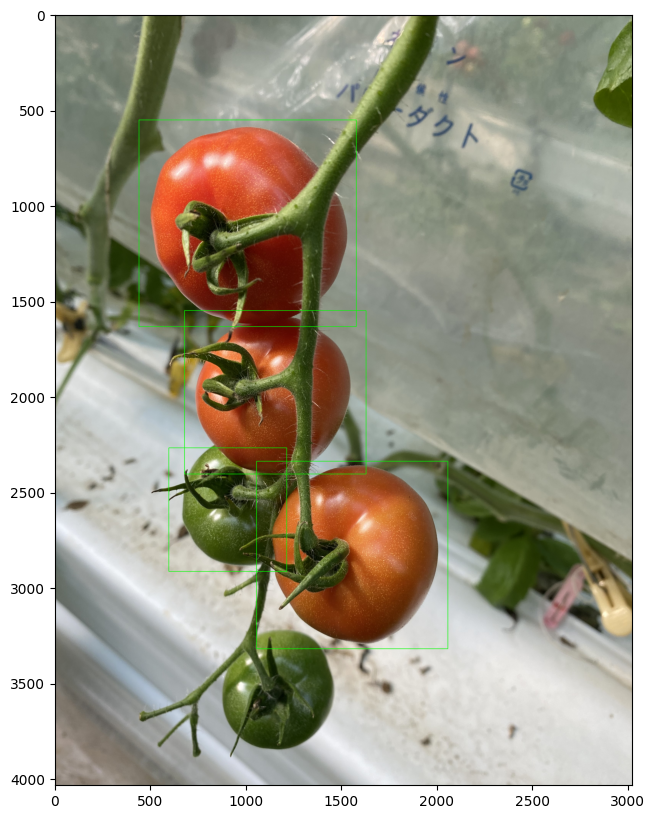

In [ ]:
plot_prediction_image(jpg_files[2])

##1.2 Making Plot predict funtion

In [ ]:
%matplotlib inline
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt

def plot_predict(image_path):

    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    # filename = 'Predict image : ' + os.path.basename(image_path)
    filename = 'Predict image : ' + image_path.split('/')[-2]

    results = model(image_path)

    result = results[0]
    bboxes = np.array(result.boxes.xyxy.cpu(), dtype='int')
    classes = np.array(result.boxes.cls.cpu(), dtype='int')
    confidences = np.array(result.boxes.conf.cpu())
    class_name = result.names
    class_name_list = [class_name[i] for i in classes]
    conf_threshold = 0

    # Dictionary to store label counts
    label_counts = {}

    for cls, bbox, conf in zip(classes, bboxes, confidences):
        if conf > conf_threshold:
            x1, y1, x2, y2 = bbox
            label = class_name[cls]
            cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 5)
            cv2.putText(image, str(label), (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 5, (0, 0, 255), 5)

            # Update label counts
            label_counts[label] = label_counts.get(label, 0) + 1

    # White image information
    cv2.putText(image, filename, (50, 150), cv2.FONT_HERSHEY_SIMPLEX, 5, (0, 255, 0), 5)
    # Write label counts on the image
    text_y = 300
    for label, count in label_counts.items():
        text = f"{label}: {count}"
        cv2.putText(image, text, (10, text_y), cv2.FONT_HERSHEY_SIMPLEX, 5, (0, 255, 0), 5)
        text_y += 100

    plt.imshow(image)
    plt.show()


image 1/1 /content/Data/Test/Ripe/IMG_20191215_111318.jpg: 640x480 3 unripes, 2 ripes, 62.0ms
Speed: 4.6ms preprocess, 62.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


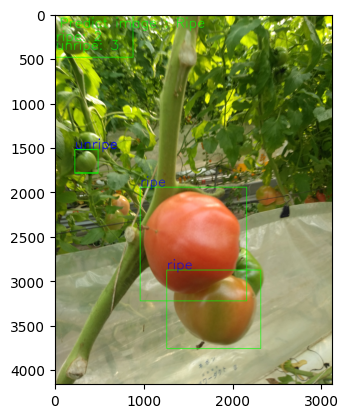

In [ ]:
plot_predict(jpg_files[1])


image 1/1 /content/Data/Test/Ripe/IMG_1224.jpg: 640x480 1 unripe, 3 ripes, 62.0ms
Speed: 2.9ms preprocess, 62.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 480)


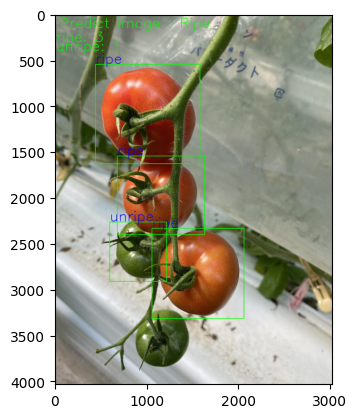

In [ ]:
plot_predict(jpg_files[2])


image 1/1 /content/Data/Test/Ripe/IMG_1103.jpg: 640x480 1 ripe, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)


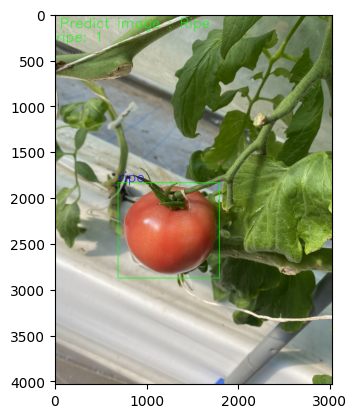

In [ ]:
plot_predict(jpg_files[50])


image 1/1 /content/Data/Test/Unripe/IMG_20191215_111412.jpg: 640x480 5 unripes, 4 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


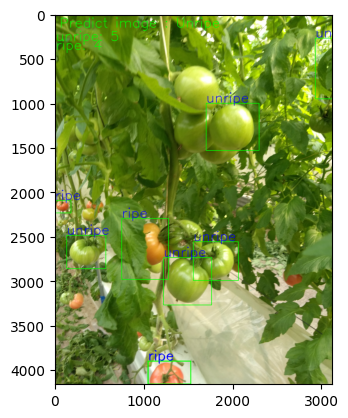

In [ ]:
plot_predict(jpg_files[100])

In [ ]:
import random
selected_paths = random.sample(jpg_files, 20)

In [ ]:
selected_paths

['/content/Data/Train/Unripe/IMG_1041.jpg',
 '/content/Data/Test/Ripe/IMG_1085.jpg',
 '/content/Data/Train/Unripe/IMG_1183.jpg',
 '/content/Data/Train/Ripe/IMG_20191215_110716.jpg',
 '/content/Data/Train/Ripe/IMG_0999.jpg',
 '/content/Data/Train/Ripe/IMG_20191215_112553.jpg',
 '/content/Data/Train/Ripe/IMG_20191215_112358.jpg',
 '/content/Data/Train/Ripe/IMG_20191215_110730.jpg',
 '/content/Data/Test/Ripe/IMG_1128.jpg',
 '/content/Data/Test/Unripe/IMG_20191215_111511.jpg',
 '/content/Data/Train/Ripe/IMG_20191215_110541.jpg',
 '/content/Data/Test/Unripe/IMG_20191215_111225.jpg',
 '/content/Data/Train/Ripe/IMG_20191215_112740.jpg',
 '/content/Data/Test/Ripe/IMG_1059.jpg',
 '/content/Data/Train/Unripe/IMG_20191215_111622.jpg',
 '/content/Data/Train/Ripe/IMG_20191215_111006.jpg',
 '/content/Data/Train/Ripe/IMG_20191215_112541.jpg',
 '/content/Data/Train/Ripe/IMG_20191215_110734.jpg',
 '/content/Data/Test/Ripe/IMG_1240.jpg',
 '/content/Data/Train/Unripe/IMG_20191215_111513.jpg']


image 1/1 /content/Data/Train/Unripe/IMG_1080.jpg: 640x480 2 unripes, 2 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


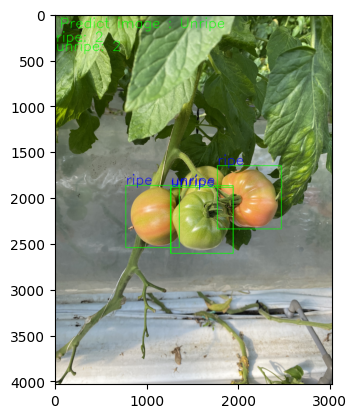


image 1/1 /content/Data/Test/Ripe/IMG_20191215_111011.jpg: 480x640 1 unripe, 4 ripes, 77.4ms
Speed: 3.0ms preprocess, 77.4ms inference, 1.1ms postprocess per image at shape (1, 3, 480, 640)


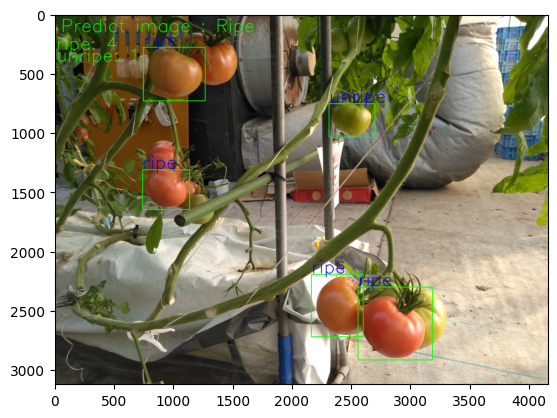


image 1/1 /content/Data/Train/Unripe/IMG_1026.jpg: 640x480 1 unripe, 63.6ms
Speed: 3.4ms preprocess, 63.6ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 480)


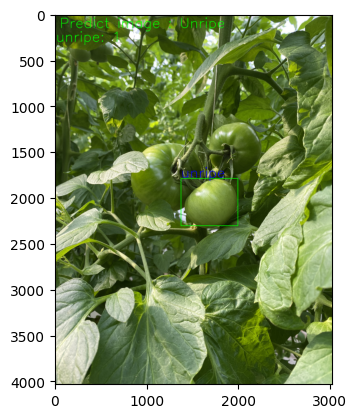


image 1/1 /content/Data/Train/Ripe/IMG_20191215_111448.jpg: 640x480 2 unripes, 2 ripes, 62.0ms
Speed: 4.3ms preprocess, 62.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 480)


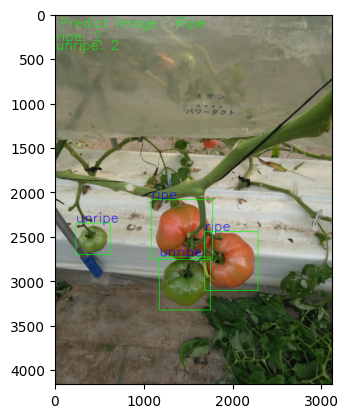


image 1/1 /content/Data/Train/Ripe/IMG_20191215_112544.jpg: 640x480 2 unripes, 6 ripes, 62.0ms
Speed: 4.1ms preprocess, 62.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 480)


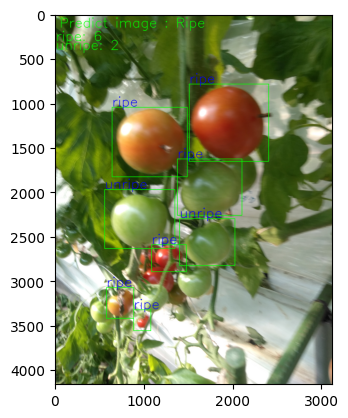


image 1/1 /content/Data/Train/Ripe/IMG_1257.jpg: 640x480 7 unripes, 9 ripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)


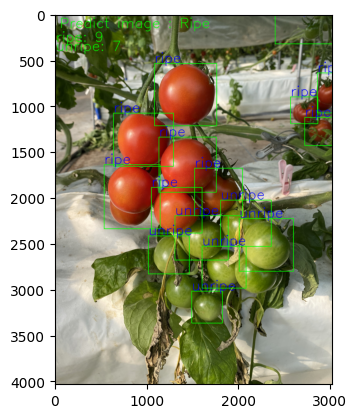


image 1/1 /content/Data/Train/Unripe/IMG_20191215_111509.jpg: 640x480 4 ripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)


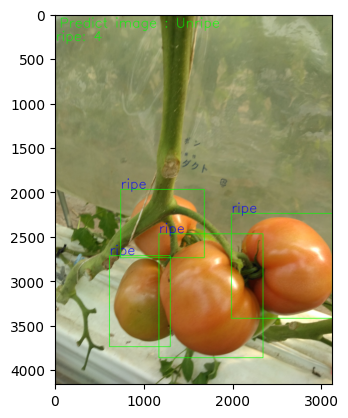


image 1/1 /content/Data/Train/Ripe/IMG_20191215_112612.jpg: 640x480 4 unripes, 9 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


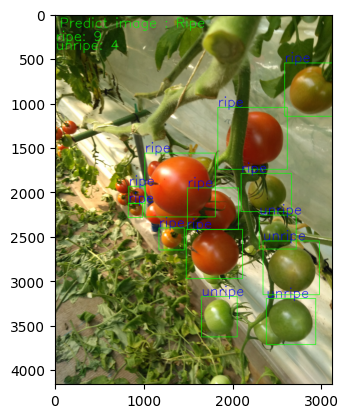


image 1/1 /content/Data/Test/Ripe/IMG_0986.jpg: 640x480 1 unripe, 3 ripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


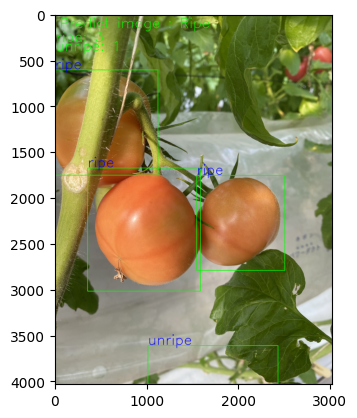


image 1/1 /content/Data/Train/Ripe/IMG_20191215_110636.jpg: 640x480 1 unripe, 2 ripes, 62.0ms
Speed: 3.2ms preprocess, 62.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


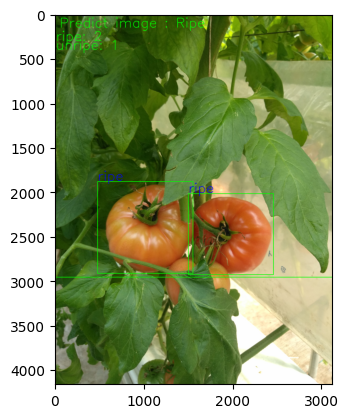


image 1/1 /content/Data/Test/Unripe/IMG_20191215_111726.jpg: 640x480 4 unripes, 1 ripe, 61.9ms
Speed: 4.2ms preprocess, 61.9ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 480)


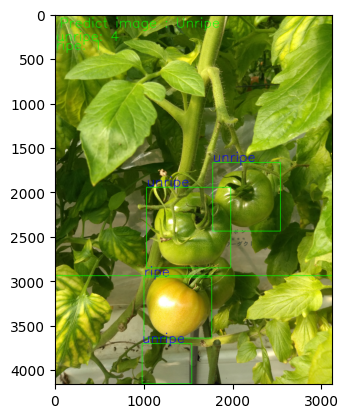


image 1/1 /content/Data/Train/Ripe/IMG_1086.jpg: 640x480 1 unripe, 1 ripe, 61.9ms
Speed: 4.1ms preprocess, 61.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


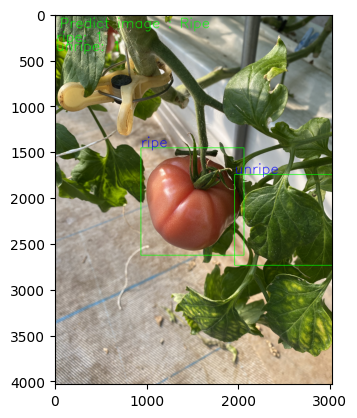


image 1/1 /content/Data/Train/Unripe/IMG_1036.jpg: 640x480 2 unripes, 1 ripe, 61.9ms
Speed: 2.9ms preprocess, 61.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)


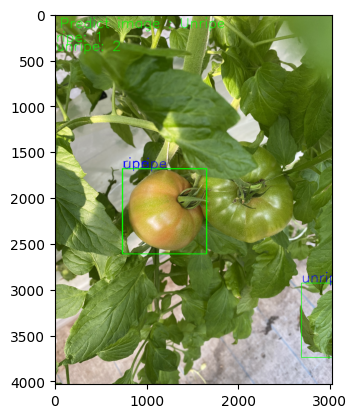


image 1/1 /content/Data/Train/Unripe/IMG_20191215_110616.jpg: 640x480 3 unripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


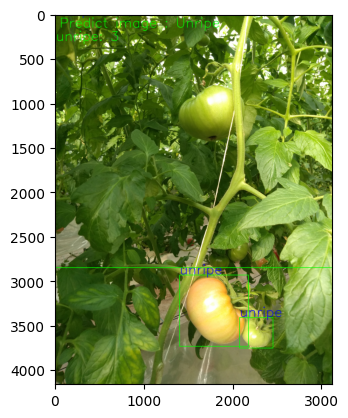


image 1/1 /content/Data/Train/Unripe/IMG_20191215_110629.jpg: 640x480 3 unripes, 1 ripe, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


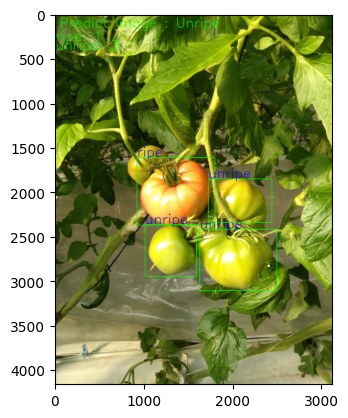


image 1/1 /content/Data/Train/Unripe/IMG_20191215_111250.jpg: 640x480 6 unripes, 1 ripe, 62.0ms
Speed: 3.1ms preprocess, 62.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


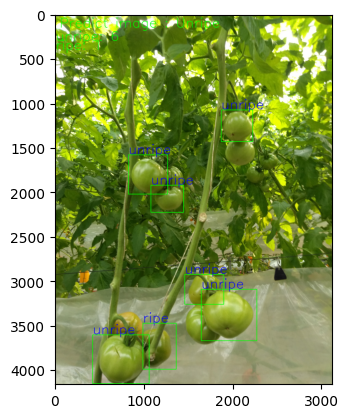


image 1/1 /content/Data/Train/Ripe/IMG_1104.jpg: 640x480 1 unripe, 3 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


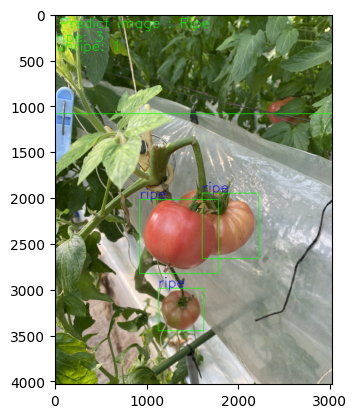


image 1/1 /content/Data/Train/Unripe/IMG_20191215_111456.jpg: 640x480 5 unripes, 5 ripes, 62.1ms
Speed: 8.1ms preprocess, 62.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)


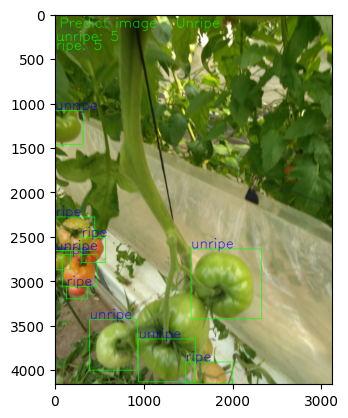


image 1/1 /content/Data/Train/Ripe/IMG_20191215_112450.jpg: 640x480 4 unripes, 3 ripes, 62.0ms
Speed: 3.1ms preprocess, 62.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


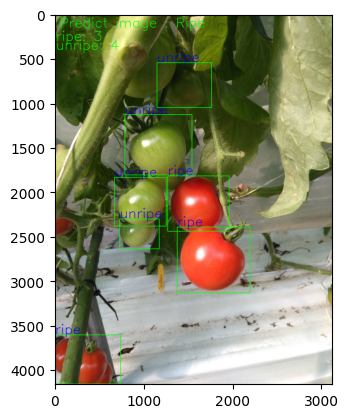


image 1/1 /content/Data/Train/Unripe/IMG_20191215_111504.jpg: 640x480 4 unripes, 61.9ms
Speed: 3.1ms preprocess, 61.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)


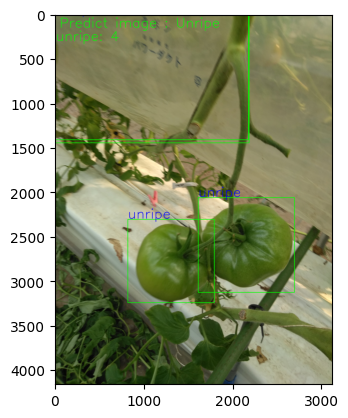

In [ ]:
selected_paths = random.sample(jpg_files, 20)
for path in selected_paths:
    plot_predict(path)


image 1/1 /content/Data/Test/Unripe/IMG_1031.jpg: 640x480 1 unripe, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


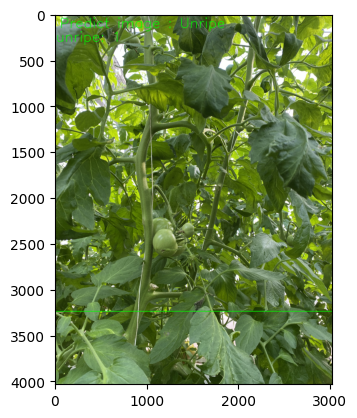


image 1/1 /content/Data/Train/Ripe/IMG_20191215_110441.jpg: 640x480 6 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


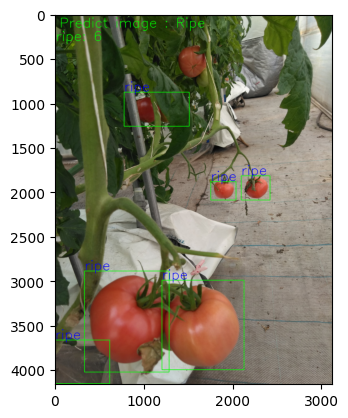


image 1/1 /content/Data/Train/Unripe/IMG_20191215_111222.jpg: 640x480 11 unripes, 2 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


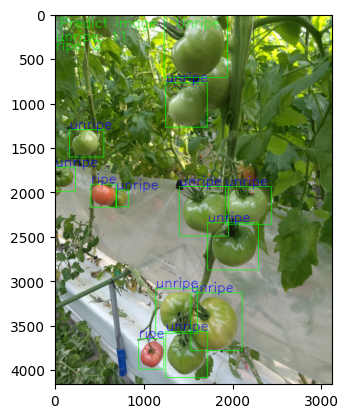


image 1/1 /content/Data/Train/Ripe/IMG_20191215_111627.jpg: 640x480 1 unripe, 2 ripes, 61.9ms
Speed: 3.1ms preprocess, 61.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


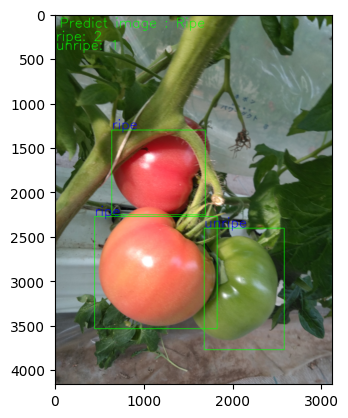


image 1/1 /content/Data/Train/Ripe/IMG_1073.jpg: 640x480 1 unripe, 1 ripe, 62.0ms
Speed: 4.0ms preprocess, 62.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


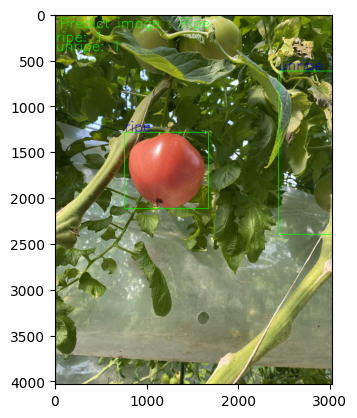


image 1/1 /content/Data/Test/Ripe/IMG_1277.jpg: 640x480 2 unripes, 4 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


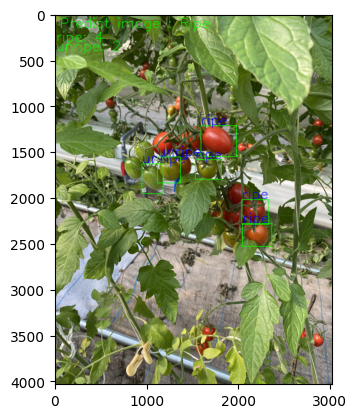


image 1/1 /content/Data/Test/Ripe/IMG_20191215_110941.jpg: 640x480 3 ripes, 62.0ms
Speed: 3.1ms preprocess, 62.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


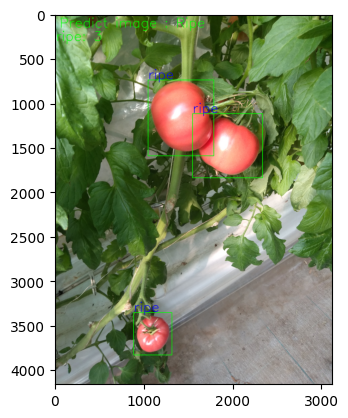


image 1/1 /content/Data/Test/Unripe/IMG_20191215_111732.jpg: 640x480 5 unripes, 62.0ms
Speed: 4.0ms preprocess, 62.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


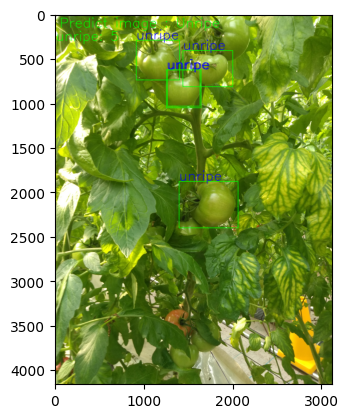


image 1/1 /content/Data/Train/Unripe/IMG_1185.jpg: 640x480 11 unripes, 3 ripes, 62.0ms
Speed: 3.1ms preprocess, 62.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


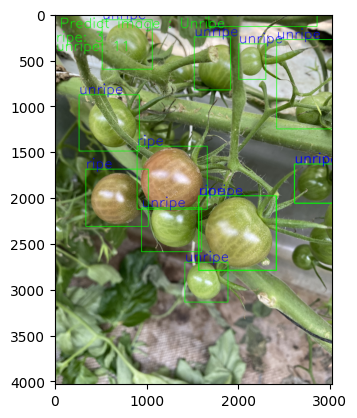


image 1/1 /content/Data/Train/Unripe/IMG_20191215_111722.jpg: 640x480 5 unripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


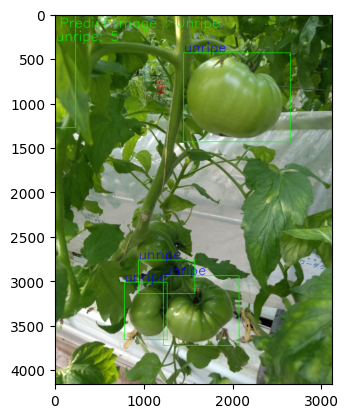


image 1/1 /content/Data/Train/Unripe/IMG_20191215_111359.jpg: 640x480 3 unripes, 3 ripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


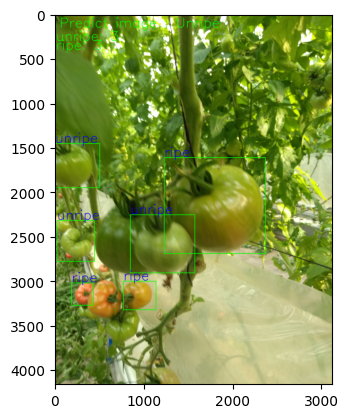


image 1/1 /content/Data/Train/Ripe/IMG_0985.jpg: 640x480 1 unripe, 3 ripes, 62.0ms
Speed: 4.1ms preprocess, 62.0ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 480)


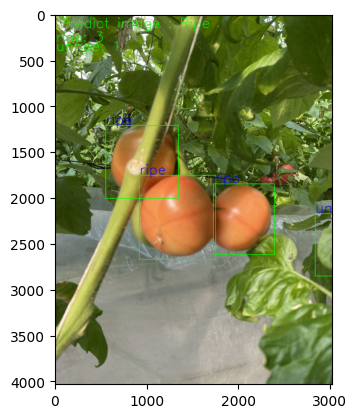


image 1/1 /content/Data/Train/Unripe/IMG_20191215_111622.jpg: 640x480 3 unripes, 1 ripe, 62.0ms
Speed: 3.1ms preprocess, 62.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)


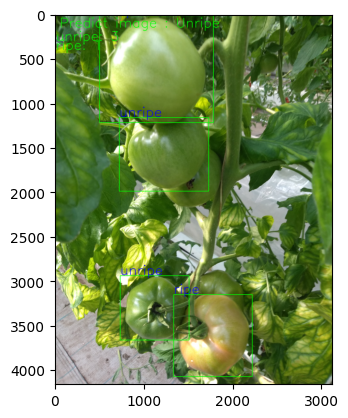


image 1/1 /content/Data/Train/Ripe/IMG_20191215_111448.jpg: 640x480 2 unripes, 2 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 480)


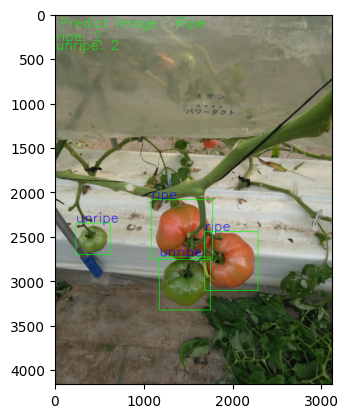


image 1/1 /content/Data/Train/Unripe/IMG_20191215_111114.jpg: 640x480 7 unripes, 5 ripes, 62.0ms
Speed: 3.1ms preprocess, 62.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


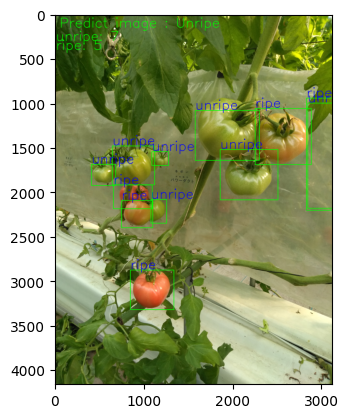


image 1/1 /content/Data/Train/Unripe/IMG_0984.jpg: 640x480 2 unripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


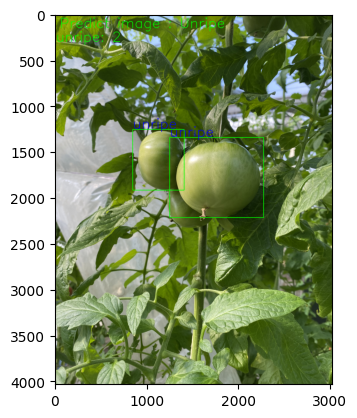


image 1/1 /content/Data/Train/Ripe/IMG_1164.jpg: 640x480 3 ripes, 62.1ms
Speed: 2.8ms preprocess, 62.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)


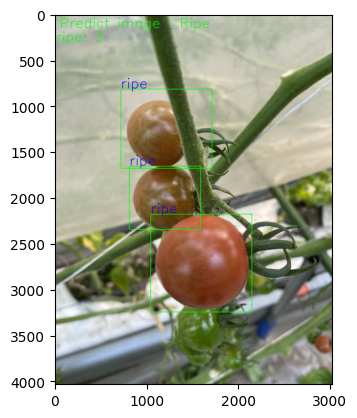


image 1/1 /content/Data/Train/Unripe/IMG_20191215_110907.jpg: 640x480 (no detections), 64.4ms
Speed: 4.1ms preprocess, 64.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


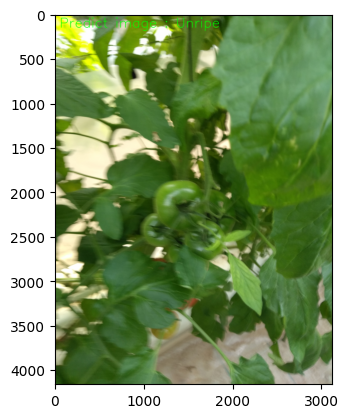


image 1/1 /content/Data/Test/Ripe/IMG_20191215_112519.jpg: 640x480 5 unripes, 2 ripes, 62.5ms
Speed: 4.2ms preprocess, 62.5ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 480)


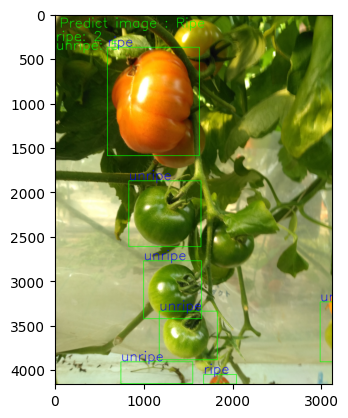


image 1/1 /content/Data/Train/Ripe/IMG_20191215_112316.jpg: 640x480 9 unripes, 8 ripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


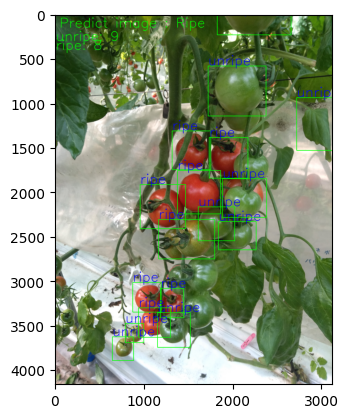

In [ ]:
selected_paths = random.sample(jpg_files, 20)
for path in selected_paths:
    plot_predict(path)


image 1/1 /content/Data/Test/Ripe/IMG_1085.jpg: 640x480 2 unripes, 2 ripes, 62.1ms
Speed: 9.8ms preprocess, 62.1ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


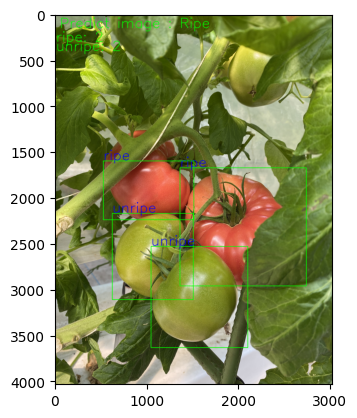


image 1/1 /content/Data/Test/Ripe/IMG_20191215_111152.jpg: 640x480 6 unripes, 3 ripes, 62.0ms
Speed: 4.5ms preprocess, 62.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


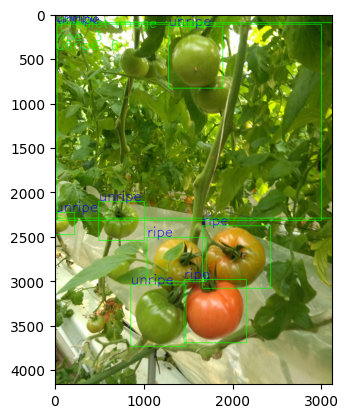


image 1/1 /content/Data/Train/Unripe/IMG_20191215_111459.jpg: 640x480 3 unripes, 62.0ms
Speed: 4.0ms preprocess, 62.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


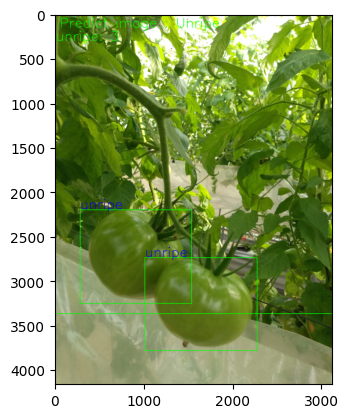


image 1/1 /content/Data/Train/Unripe/IMG_1043.jpg: 640x480 3 unripes, 62.0ms
Speed: 2.9ms preprocess, 62.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


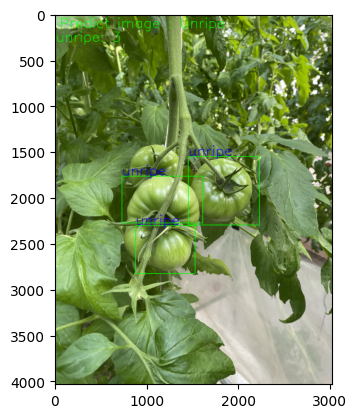


image 1/1 /content/Data/Train/Ripe/IMG_20191215_111006.jpg: 640x480 5 ripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


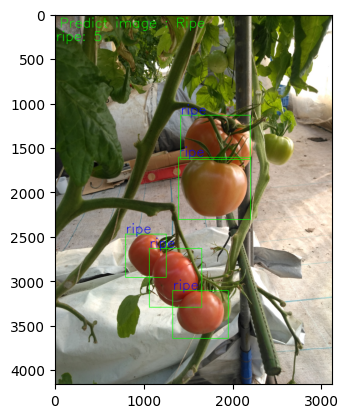


image 1/1 /content/Data/Test/Unripe/IMG_20191215_111341.jpg: 640x480 5 unripes, 61.9ms
Speed: 3.1ms preprocess, 61.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


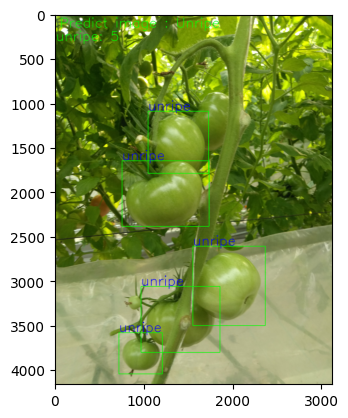


image 1/1 /content/Data/Test/Ripe/IMG_20191215_112718.jpg: 640x480 4 unripes, 12 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)


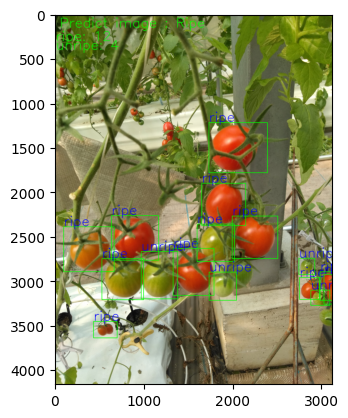


image 1/1 /content/Data/Train/Unripe/IMG_20191215_111509.jpg: 640x480 4 ripes, 61.9ms
Speed: 3.2ms preprocess, 61.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


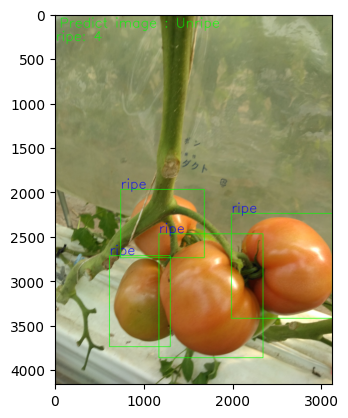


image 1/1 /content/Data/Train/Unripe/IMG_20191215_110931.jpg: 640x480 2 unripes, 3 ripes, 62.0ms
Speed: 3.9ms preprocess, 62.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


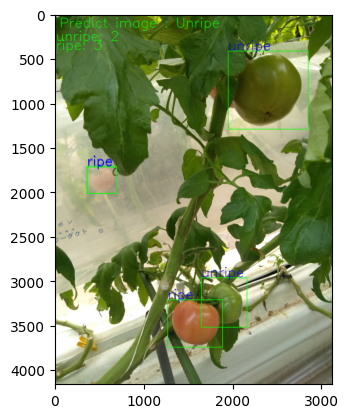


image 1/1 /content/Data/Test/Ripe/IMG_1222.jpg: 640x480 3 unripes, 3 ripes, 61.9ms
Speed: 4.0ms preprocess, 61.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


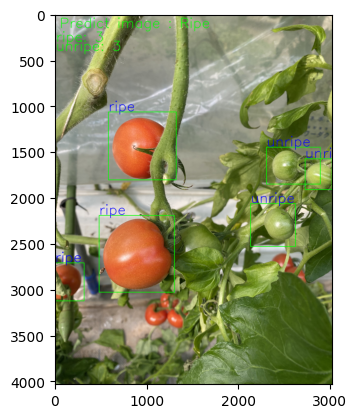


image 1/1 /content/Data/Train/Ripe/IMG_20191215_112504.jpg: 640x480 4 unripes, 7 ripes, 61.9ms
Speed: 3.1ms preprocess, 61.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


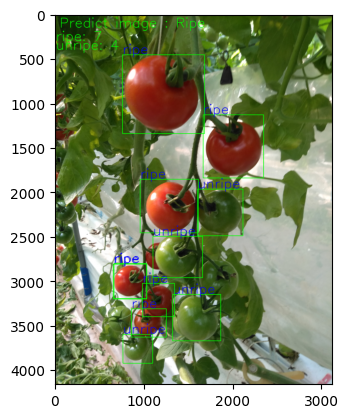


image 1/1 /content/Data/Train/Ripe/IMG_20191215_110730.jpg: 640x480 3 ripes, 61.9ms
Speed: 3.1ms preprocess, 61.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


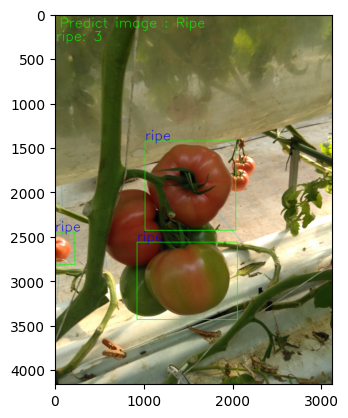


image 1/1 /content/Data/Test/Unripe/IMG_1011.jpg: 640x480 2 unripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


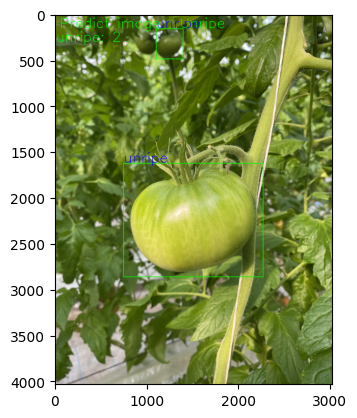


image 1/1 /content/Data/Train/Unripe/IMG_1026.jpg: 640x480 1 unripe, 61.9ms
Speed: 3.1ms preprocess, 61.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


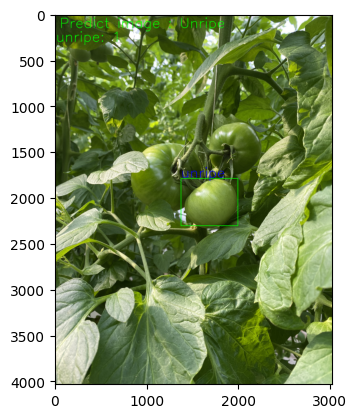


image 1/1 /content/Data/Train/Unripe/IMG_20191215_110856.jpg: 640x480 3 unripes, 61.9ms
Speed: 3.1ms preprocess, 61.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


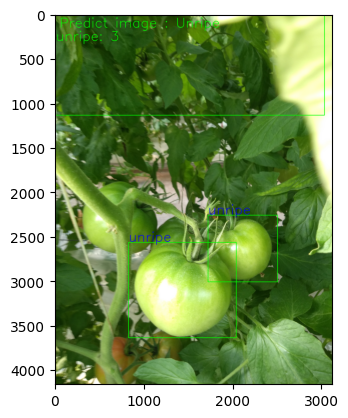


image 1/1 /content/Data/Train/Ripe/IMG_1023.jpg: 640x480 2 ripes, 61.9ms
Speed: 2.9ms preprocess, 61.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


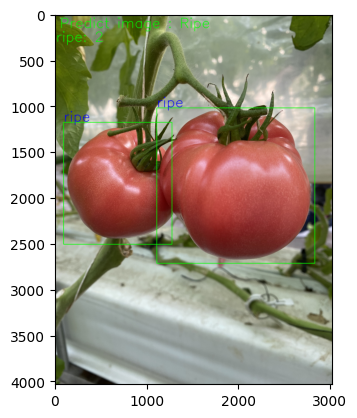


image 1/1 /content/Data/Train/Ripe/IMG_20191215_112529.jpg: 640x480 2 ripes, 62.1ms
Speed: 4.1ms preprocess, 62.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


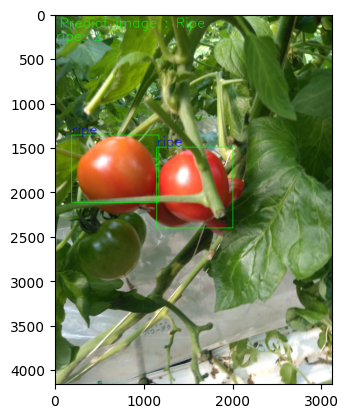


image 1/1 /content/Data/Train/Unripe/IMG_20191215_111331.jpg: 640x480 3 unripes, 2 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 480)


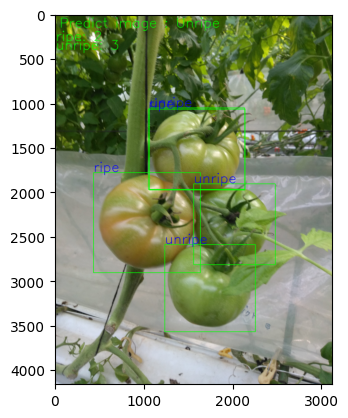


image 1/1 /content/Data/Test/Unripe/IMG_20191215_111412.jpg: 640x480 5 unripes, 4 ripes, 62.1ms
Speed: 4.2ms preprocess, 62.1ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 480)


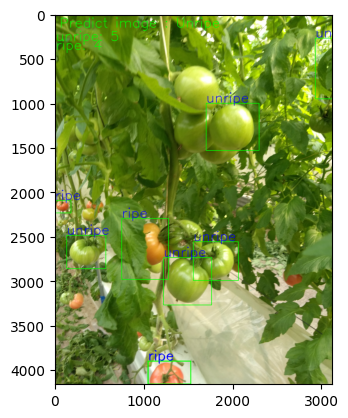


image 1/1 /content/Data/Test/Unripe/IMG_1066.jpg: 640x480 4 unripes, 2 ripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


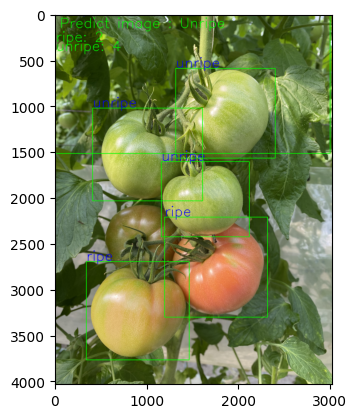

In [ ]:
selected_paths = random.sample(jpg_files, 20)
for path in selected_paths:
    plot_predict(path)

# 2.Making Annotationfile

In [ ]:
import os
import glob
import shutil
from tqdm import tqdm

# Path to the main directory
main_dir = '/content/Data'

# Path to the target directory
target_dir = '/content/datasets/images'

# Ensure the target directory exists
os.makedirs(target_dir, exist_ok=True)

# Get list of all .jpg files in directory and subdirectories
jpg_files = glob.glob(os.path.join(main_dir, '**', '*.jpg'), recursive=True)

# Copy each .jpg file to the target directory with progress bar
for file in tqdm(jpg_files, desc="Copying files"):
    shutil.copy(file, target_dir)

Copying files: 100%|██████████| 439/439 [00:07<00:00, 55.12it/s] 


In [ ]:
## List file path
import glob

# Path to the target directory
target_dir = '/content/datasets/images'

# List all files in the target directory
files = glob.glob(os.path.join(target_dir, '*'))

In [ ]:
model.names

{0: 'unripe', 1: 'ripe'}

In [ ]:
files[0]

'/content/datasets/images/IMG_1005.jpg'

In [ ]:
# Function to save YOLO predictions to annotation file
import numpy as np

def save_predictions_to_annotation(image_path, annotation_dir):
    # Get the base name of the image without the extension
    image_basename = os.path.splitext(os.path.basename(image_path))[0]
    # Generate the annotation file name by appending '.txt' to the base name
    annotation_filename = image_basename + '.txt'
    # Combine the annotation directory and annotation filename to get the full path
    annotation_path = os.path.join(annotation_dir, annotation_filename)

    # Create the annotation directory if it doesn't exist
    os.makedirs(annotation_dir, exist_ok=True)

    # Load the image
    image = cv2.imread(image_path)

    # Get the predictions
    results = model(image_path)
    result = results[0]
    bboxes = np.array(result.boxes.xywhn.cpu())
    classes = np.array(result.boxes.cls.cpu(), dtype='int')
    confidences = np.array(result.boxes.conf.cpu())
    conf_threshold = 0

    # Write predictions to the annotation file
    with open(annotation_path, 'w') as f:
        for cls, bbox, conf in zip(classes, bboxes, confidences):

            x1, y1, x2, y2 = bbox
            if conf > conf_threshold:
                x1, y1, w, h = bbox

                f.write(f"{cls} {x1:.8f} {y1:.8f} {w:.8f} {h:.8f}\n")


In [ ]:
save_predictions_to_annotation(files[0], '/content/datasets/labels')


image 1/1 /content/datasets/images/IMG_1005.jpg: 640x480 7 unripes, 62.2ms
Speed: 4.3ms preprocess, 62.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)


In [ ]:
from tqdm import tqdm

annotation_dir = '/content/datasets/labels'

# Loop through each image path and save predictions to annotation file
for image_path in tqdm(files, desc="Processing images"):
    save_predictions_to_annotation(image_path, annotation_dir)

Processing images:   0%|          | 0/439 [00:00<?, ?it/s]


image 1/1 /content/datasets/images/IMG_1005.jpg: 640x480 7 unripes, 62.0ms
Speed: 3.2ms preprocess, 62.0ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)


Processing images:   0%|          | 1/439 [00:00<04:38,  1.57it/s]


image 1/1 /content/datasets/images/IMG_20191215_111353.jpg: 640x480 6 unripes, 1 ripe, 62.0ms
Speed: 3.2ms preprocess, 62.0ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)


Processing images:   0%|          | 2/439 [00:00<02:58,  2.45it/s]


image 1/1 /content/datasets/images/IMG_1204.jpg: 640x480 5 unripes, 61.8ms
Speed: 3.0ms preprocess, 61.8ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:   1%|          | 3/439 [00:01<02:51,  2.54it/s]


image 1/1 /content/datasets/images/IMG_20191215_111430.jpg: 640x480 7 unripes, 62.0ms
Speed: 3.1ms preprocess, 62.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:   1%|          | 4/439 [00:01<02:28,  2.94it/s]


image 1/1 /content/datasets/images/IMG_20191215_111407.jpg: 640x480 3 unripes, 4 ripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:   1%|          | 5/439 [00:01<02:11,  3.29it/s]


image 1/1 /content/datasets/images/IMG_20191215_111006.jpg: 640x480 5 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:   1%|▏         | 6/439 [00:02<02:02,  3.54it/s]


image 1/1 /content/datasets/images/IMG_20191215_111303.jpg: 640x480 2 unripes, 4 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:   2%|▏         | 7/439 [00:02<01:55,  3.76it/s]


image 1/1 /content/datasets/images/IMG_20191215_111215.jpg: 640x480 3 unripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:   2%|▏         | 8/439 [00:02<01:50,  3.89it/s]


image 1/1 /content/datasets/images/IMG_1161.jpg: 640x480 1 unripe, 2 ripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:   2%|▏         | 9/439 [00:02<02:01,  3.53it/s]


image 1/1 /content/datasets/images/IMG_20191215_111930.jpg: 640x480 3 unripes, 7 ripes, 62.0ms
Speed: 3.3ms preprocess, 62.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:   2%|▏         | 10/439 [00:03<01:56,  3.69it/s]


image 1/1 /content/datasets/images/IMG_1001.jpg: 640x480 1 unripe, 2 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:   3%|▎         | 11/439 [00:03<02:07,  3.37it/s]


image 1/1 /content/datasets/images/IMG_20191215_111331.jpg: 640x480 3 unripes, 2 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:   3%|▎         | 12/439 [00:03<01:58,  3.61it/s]


image 1/1 /content/datasets/images/IMG_1175.jpg: 640x480 4 unripes, 1 ripe, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)


Processing images:   3%|▎         | 13/439 [00:04<02:09,  3.29it/s]


image 1/1 /content/datasets/images/IMG_20191215_110943.jpg: 640x480 3 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:   3%|▎         | 14/439 [00:04<02:01,  3.50it/s]


image 1/1 /content/datasets/images/IMG_20191215_111318.jpg: 640x480 3 unripes, 2 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)


Processing images:   3%|▎         | 15/439 [00:04<01:54,  3.69it/s]


image 1/1 /content/datasets/images/IMG_1224.jpg: 640x480 1 unripe, 3 ripes, 61.9ms
Speed: 2.9ms preprocess, 61.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:   4%|▎         | 16/439 [00:04<02:04,  3.39it/s]


image 1/1 /content/datasets/images/IMG_1294.jpg: 640x480 1 unripe, 5 ripes, 62.0ms
Speed: 2.9ms preprocess, 62.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:   4%|▍         | 17/439 [00:05<02:10,  3.24it/s]


image 1/1 /content/datasets/images/IMG_1043.jpg: 640x480 3 unripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:   4%|▍         | 18/439 [00:05<02:16,  3.07it/s]


image 1/1 /content/datasets/images/IMG_20191215_112527.jpg: 640x480 2 ripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:   4%|▍         | 19/439 [00:05<02:04,  3.37it/s]


image 1/1 /content/datasets/images/IMG_20191215_112450.jpg: 640x480 4 unripes, 3 ripes, 62.0ms
Speed: 3.1ms preprocess, 62.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:   5%|▍         | 20/439 [00:06<01:57,  3.58it/s]


image 1/1 /content/datasets/images/IMG_20191215_111918.jpg: 640x480 5 ripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)


Processing images:   5%|▍         | 21/439 [00:06<01:51,  3.74it/s]


image 1/1 /content/datasets/images/IMG_20191215_111511.jpg: 640x480 3 unripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:   5%|▌         | 22/439 [00:06<01:46,  3.91it/s]


image 1/1 /content/datasets/images/IMG_20191215_111651.jpg: 640x480 1 unripe, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:   5%|▌         | 23/439 [00:06<01:43,  4.04it/s]


image 1/1 /content/datasets/images/IMG_20191215_112918.jpg: 640x480 6 unripes, 1 ripe, 61.9ms
Speed: 3.5ms preprocess, 61.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:   5%|▌         | 24/439 [00:06<01:42,  4.03it/s]


image 1/1 /content/datasets/images/IMG_20191215_112519.jpg: 640x480 5 unripes, 2 ripes, 61.9ms
Speed: 3.1ms preprocess, 61.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:   6%|▌         | 25/439 [00:07<01:41,  4.07it/s]


image 1/1 /content/datasets/images/IMG_20191215_111722.jpg: 640x480 5 unripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:   6%|▌         | 26/439 [00:07<01:40,  4.12it/s]


image 1/1 /content/datasets/images/IMG_1109.jpg: 640x480 5 unripes, 61.9ms
Speed: 2.9ms preprocess, 61.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)


Processing images:   6%|▌         | 27/439 [00:07<01:54,  3.61it/s]


image 1/1 /content/datasets/images/IMG_20191215_112715.jpg: 640x480 2 unripes, 4 ripes, 62.0ms
Speed: 3.6ms preprocess, 62.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


Processing images:   6%|▋         | 28/439 [00:08<01:51,  3.69it/s]


image 1/1 /content/datasets/images/IMG_1077.jpg: 640x480 3 unripes, 62.0ms
Speed: 3.2ms preprocess, 62.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:   7%|▋         | 29/439 [00:08<02:02,  3.34it/s]


image 1/1 /content/datasets/images/IMG_0988.jpg: 640x480 6 unripes, 63.4ms
Speed: 4.1ms preprocess, 63.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


Processing images:   7%|▋         | 30/439 [00:08<02:15,  3.02it/s]


image 1/1 /content/datasets/images/IMG_0994.jpg: 640x480 1 unripe, 1 ripe, 62.0ms
Speed: 3.9ms preprocess, 62.0ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)


Processing images:   7%|▋         | 31/439 [00:09<02:36,  2.61it/s]


image 1/1 /content/datasets/images/IMG_20191215_111733.jpg: 640x480 4 unripes, 62.1ms
Speed: 4.0ms preprocess, 62.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)


Processing images:   7%|▋         | 32/439 [00:09<02:27,  2.77it/s]


image 1/1 /content/datasets/images/IMG_1029.jpg: 640x480 2 unripes, 2 ripes, 62.0ms
Speed: 4.1ms preprocess, 62.0ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)


Processing images:   8%|▊         | 33/439 [00:10<02:42,  2.49it/s]


image 1/1 /content/datasets/images/IMG_20191215_112552.jpg: 640x480 6 unripes, 6 ripes, 61.9ms
Speed: 4.1ms preprocess, 61.9ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)


Processing images:   8%|▊         | 34/439 [00:10<02:31,  2.68it/s]


image 1/1 /content/datasets/images/IMG_20191215_112805.jpg: 640x480 10 unripes, 1 ripe, 62.0ms
Speed: 3.9ms preprocess, 62.0ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)


Processing images:   8%|▊         | 35/439 [00:10<02:23,  2.81it/s]


image 1/1 /content/datasets/images/IMG_20191215_110820.jpg: 480x640 4 ripes, 68.1ms
Speed: 4.1ms preprocess, 68.1ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)


Processing images:   8%|▊         | 36/439 [00:11<02:19,  2.89it/s]


image 1/1 /content/datasets/images/IMG_1008.jpg: 640x480 1 ripe, 63.1ms
Speed: 4.0ms preprocess, 63.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:   8%|▊         | 37/439 [00:11<02:36,  2.57it/s]


image 1/1 /content/datasets/images/IMG_1025.jpg: 640x480 6 unripes, 1 ripe, 61.9ms
Speed: 4.1ms preprocess, 61.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


Processing images:   9%|▊         | 38/439 [00:12<02:49,  2.36it/s]


image 1/1 /content/datasets/images/IMG_20191215_111813.jpg: 640x480 1 unripe, 61.9ms
Speed: 3.2ms preprocess, 61.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:   9%|▉         | 39/439 [00:12<02:30,  2.66it/s]


image 1/1 /content/datasets/images/IMG_20191215_110647.jpg: 640x480 5 unripes, 3 ripes, 61.9ms
Speed: 3.1ms preprocess, 61.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


Processing images:   9%|▉         | 40/439 [00:12<02:13,  2.99it/s]


image 1/1 /content/datasets/images/IMG_0991.jpg: 640x480 4 ripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


Processing images:   9%|▉         | 41/439 [00:12<02:15,  2.94it/s]


image 1/1 /content/datasets/images/IMG_20191215_111914.jpg: 640x480 1 unripe, 4 ripes, 62.0ms
Speed: 4.5ms preprocess, 62.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  10%|▉         | 42/439 [00:13<02:05,  3.16it/s]


image 1/1 /content/datasets/images/IMG_1265.jpg: 640x480 3 unripes, 2 ripes, 61.9ms
Speed: 3.1ms preprocess, 61.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  10%|▉         | 43/439 [00:13<02:10,  3.02it/s]


image 1/1 /content/datasets/images/IMG_20191215_111448.jpg: 640x480 2 unripes, 2 ripes, 61.9ms
Speed: 3.1ms preprocess, 61.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  10%|█         | 44/439 [00:13<01:59,  3.32it/s]


image 1/1 /content/datasets/images/IMG_0984.jpg: 640x480 2 unripes, 61.9ms
Speed: 2.9ms preprocess, 61.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  10%|█         | 45/439 [00:14<02:07,  3.09it/s]


image 1/1 /content/datasets/images/IMG_20191215_111254.jpg: 640x480 4 unripes, 3 ripes, 61.9ms
Speed: 2.9ms preprocess, 61.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  10%|█         | 46/439 [00:14<01:56,  3.36it/s]


image 1/1 /content/datasets/images/IMG_20191215_112838.jpg: 640x480 6 unripes, 2 ripes, 61.9ms
Speed: 3.1ms preprocess, 61.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  11%|█         | 47/439 [00:14<01:50,  3.56it/s]


image 1/1 /content/datasets/images/IMG_20191215_112641.jpg: 640x480 4 unripes, 12 ripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  11%|█         | 48/439 [00:14<01:47,  3.65it/s]


image 1/1 /content/datasets/images/IMG_20191215_111515.jpg: 640x480 4 ripes, 62.0ms
Speed: 3.2ms preprocess, 62.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  11%|█         | 49/439 [00:15<01:44,  3.72it/s]


image 1/1 /content/datasets/images/IMG_20191215_110524.jpg: 640x480 3 ripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  11%|█▏        | 50/439 [00:15<01:41,  3.82it/s]


image 1/1 /content/datasets/images/IMG_1011.jpg: 640x480 2 unripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  12%|█▏        | 51/439 [00:15<01:52,  3.44it/s]


image 1/1 /content/datasets/images/IMG_1113.jpg: 640x480 7 unripes, 2 ripes, 62.1ms
Speed: 4.1ms preprocess, 62.1ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  12%|█▏        | 52/439 [00:16<02:07,  3.04it/s]


image 1/1 /content/datasets/images/IMG_1275.jpg: 640x480 9 unripes, 2 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  12%|█▏        | 53/439 [00:16<02:10,  2.96it/s]


image 1/1 /content/datasets/images/IMG_20191215_112601.jpg: 640x480 6 ripes, 61.9ms
Speed: 3.1ms preprocess, 61.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  12%|█▏        | 54/439 [00:16<01:57,  3.27it/s]


image 1/1 /content/datasets/images/IMG_1186.jpg: 640x480 7 unripes, 2 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  13%|█▎        | 55/439 [00:17<02:08,  2.98it/s]


image 1/1 /content/datasets/images/IMG_1283.jpg: 640x480 12 unripes, 4 ripes, 61.9ms
Speed: 2.9ms preprocess, 61.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  13%|█▎        | 56/439 [00:17<02:13,  2.86it/s]


image 1/1 /content/datasets/images/IMG_20191215_110853.jpg: 640x480 3 unripes, 1 ripe, 62.0ms
Speed: 3.1ms preprocess, 62.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  13%|█▎        | 57/439 [00:17<02:00,  3.18it/s]


image 1/1 /content/datasets/images/IMG_20191215_111640.jpg: 640x480 2 unripes, 3 ripes, 61.8ms
Speed: 3.0ms preprocess, 61.8ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  13%|█▎        | 58/439 [00:18<01:49,  3.47it/s]


image 1/1 /content/datasets/images/IMG_1277.jpg: 640x480 2 unripes, 4 ripes, 62.0ms
Speed: 4.0ms preprocess, 62.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  13%|█▎        | 59/439 [00:18<02:10,  2.92it/s]


image 1/1 /content/datasets/images/IMG_20191215_110517.jpg: 640x480 1 ripe, 62.1ms
Speed: 4.0ms preprocess, 62.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  14%|█▎        | 60/439 [00:18<02:05,  3.01it/s]


image 1/1 /content/datasets/images/IMG_20191215_110616.jpg: 640x480 3 unripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  14%|█▍        | 61/439 [00:19<02:03,  3.06it/s]


image 1/1 /content/datasets/images/IMG_20191215_111744.jpg: 640x480 8 unripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  14%|█▍        | 62/439 [00:19<01:54,  3.29it/s]


image 1/1 /content/datasets/images/IMG_20191215_112609.jpg: 640x480 1 unripe, 3 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  14%|█▍        | 63/439 [00:19<01:46,  3.53it/s]


image 1/1 /content/datasets/images/IMG_20191215_112843.jpg: 640x480 1 unripe, 5 ripes, 61.8ms
Speed: 3.0ms preprocess, 61.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  15%|█▍        | 64/439 [00:19<01:43,  3.63it/s]


image 1/1 /content/datasets/images/IMG_20191215_112554.jpg: 640x480 4 unripes, 4 ripes, 62.0ms
Speed: 3.4ms preprocess, 62.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  15%|█▍        | 65/439 [00:20<01:39,  3.75it/s]


image 1/1 /content/datasets/images/IMG_1042.jpg: 640x480 2 unripes, 62.0ms
Speed: 2.9ms preprocess, 62.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  15%|█▌        | 66/439 [00:20<01:52,  3.32it/s]


image 1/1 /content/datasets/images/IMG_20191215_112508.jpg: 640x480 5 unripes, 7 ripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  15%|█▌        | 67/439 [00:20<01:43,  3.59it/s]


image 1/1 /content/datasets/images/IMG_20191215_111736.jpg: 640x480 3 ripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  15%|█▌        | 68/439 [00:20<01:38,  3.75it/s]


image 1/1 /content/datasets/images/IMG_20191215_111250.jpg: 640x480 6 unripes, 1 ripe, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  16%|█▌        | 69/439 [00:21<01:37,  3.81it/s]


image 1/1 /content/datasets/images/IMG_20191215_112718.jpg: 640x480 4 unripes, 12 ripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  16%|█▌        | 70/439 [00:21<01:36,  3.84it/s]


image 1/1 /content/datasets/images/IMG_1284.jpg: 640x480 6 unripes, 2 ripes, 61.9ms
Speed: 2.9ms preprocess, 61.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  16%|█▌        | 71/439 [00:21<01:47,  3.43it/s]


image 1/1 /content/datasets/images/IMG_1214.jpg: 640x480 6 unripes, 5 ripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  16%|█▋        | 72/439 [00:22<01:53,  3.22it/s]


image 1/1 /content/datasets/images/IMG_1253.jpg: 640x480 7 unripes, 62.0ms
Speed: 4.0ms preprocess, 62.0ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  17%|█▋        | 73/439 [00:22<02:10,  2.80it/s]


image 1/1 /content/datasets/images/IMG_20191215_111435.jpg: 640x480 6 unripes, 1 ripe, 62.0ms
Speed: 4.0ms preprocess, 62.0ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  17%|█▋        | 74/439 [00:22<02:02,  2.97it/s]


image 1/1 /content/datasets/images/IMG_1189.jpg: 640x480 7 unripes, 62.1ms
Speed: 5.8ms preprocess, 62.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  17%|█▋        | 75/439 [00:23<02:19,  2.61it/s]


image 1/1 /content/datasets/images/IMG_20191215_111409.jpg: 640x480 6 unripes, 1 ripe, 62.0ms
Speed: 4.0ms preprocess, 62.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  17%|█▋        | 76/439 [00:23<02:09,  2.81it/s]


image 1/1 /content/datasets/images/IMG_1080.jpg: 640x480 2 unripes, 2 ripes, 62.0ms
Speed: 4.0ms preprocess, 62.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  18%|█▊        | 77/439 [00:24<02:19,  2.60it/s]


image 1/1 /content/datasets/images/IMG_20191215_111007.jpg: 640x480 2 ripes, 61.9ms
Speed: 4.0ms preprocess, 61.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  18%|█▊        | 78/439 [00:24<02:16,  2.65it/s]


image 1/1 /content/datasets/images/IMG_20191215_110728.jpg: 640x480 2 unripes, 3 ripes, 62.1ms
Speed: 4.0ms preprocess, 62.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  18%|█▊        | 79/439 [00:24<02:07,  2.83it/s]


image 1/1 /content/datasets/images/IMG_20191215_110835.jpg: 640x480 1 unripe, 4 ripes, 62.0ms
Speed: 4.3ms preprocess, 62.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  18%|█▊        | 80/439 [00:25<02:01,  2.95it/s]


image 1/1 /content/datasets/images/IMG_0983.jpg: 640x480 4 unripes, 62.0ms
Speed: 3.9ms preprocess, 62.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  18%|█▊        | 81/439 [00:25<02:18,  2.58it/s]


image 1/1 /content/datasets/images/IMG_1192.jpg: 640x480 7 unripes, 1 ripe, 61.9ms
Speed: 2.9ms preprocess, 61.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  19%|█▊        | 82/439 [00:26<02:19,  2.55it/s]


image 1/1 /content/datasets/images/IMG_20191215_112544.jpg: 640x480 2 unripes, 6 ripes, 61.9ms
Speed: 3.1ms preprocess, 61.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  19%|█▉        | 83/439 [00:26<02:03,  2.89it/s]


image 1/1 /content/datasets/images/IMG_20191215_112616.jpg: 640x480 7 unripes, 1 ripe, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  19%|█▉        | 84/439 [00:26<01:51,  3.19it/s]


image 1/1 /content/datasets/images/IMG_1167.jpg: 640x480 1 unripe, 4 ripes, 61.9ms
Speed: 2.9ms preprocess, 61.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  19%|█▉        | 85/439 [00:26<01:55,  3.07it/s]


image 1/1 /content/datasets/images/IMG_1054.jpg: 640x480 1 unripe, 1 ripe, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  20%|█▉        | 86/439 [00:27<01:59,  2.96it/s]


image 1/1 /content/datasets/images/IMG_1237.jpg: 640x480 4 unripes, 5 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  20%|█▉        | 87/439 [00:27<02:01,  2.90it/s]


image 1/1 /content/datasets/images/IMG_20191215_111547.jpg: 640x480 2 unripes, 1 ripe, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  20%|██        | 88/439 [00:27<01:50,  3.19it/s]


image 1/1 /content/datasets/images/IMG_1234.jpg: 640x480 4 unripes, 6 ripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  20%|██        | 89/439 [00:28<01:56,  3.01it/s]


image 1/1 /content/datasets/images/IMG_1255.jpg: 640x480 1 unripe, 3 ripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  21%|██        | 90/439 [00:28<02:00,  2.90it/s]


image 1/1 /content/datasets/images/IMG_1128.jpg: 640x480 5 unripes, 6 ripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  21%|██        | 91/439 [00:28<02:02,  2.84it/s]


image 1/1 /content/datasets/images/IMG_1002.jpg: 640x480 1 unripe, 3 ripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  21%|██        | 92/439 [00:29<02:03,  2.81it/s]


image 1/1 /content/datasets/images/IMG_1057.jpg: 640x480 1 unripe, 3 ripes, 62.0ms
Speed: 4.2ms preprocess, 62.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  21%|██        | 93/439 [00:29<02:02,  2.82it/s]


image 1/1 /content/datasets/images/IMG_20191215_111116.jpg: 640x480 6 unripes, 2 ripes, 61.9ms
Speed: 3.2ms preprocess, 61.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  21%|██▏       | 94/439 [00:29<01:50,  3.12it/s]


image 1/1 /content/datasets/images/IMG_1037.jpg: 640x480 4 unripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  22%|██▏       | 95/439 [00:30<01:55,  2.97it/s]


image 1/1 /content/datasets/images/IMG_20191215_111504.jpg: 640x480 4 unripes, 62.0ms
Speed: 3.1ms preprocess, 62.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  22%|██▏       | 96/439 [00:30<01:47,  3.18it/s]


image 1/1 /content/datasets/images/IMG_0992.jpg: 640x480 1 unripe, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  22%|██▏       | 97/439 [00:30<01:53,  3.02it/s]


image 1/1 /content/datasets/images/IMG_20191215_111059.jpg: 640x480 2 unripes, 1 ripe, 61.9ms
Speed: 3.1ms preprocess, 61.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  22%|██▏       | 98/439 [00:31<01:44,  3.26it/s]


image 1/1 /content/datasets/images/IMG_20191215_111516.jpg: 640x480 1 ripe, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  23%|██▎       | 99/439 [00:31<01:36,  3.52it/s]


image 1/1 /content/datasets/images/IMG_1146.jpg: 640x480 (no detections), 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  23%|██▎       | 100/439 [00:31<01:48,  3.13it/s]


image 1/1 /content/datasets/images/IMG_20191215_112401.jpg: 640x480 3 unripes, 7 ripes, 61.9ms
Speed: 3.7ms preprocess, 61.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  23%|██▎       | 101/439 [00:32<01:39,  3.38it/s]


image 1/1 /content/datasets/images/IMG_1088.jpg: 640x480 1 ripe, 61.9ms
Speed: 3.4ms preprocess, 61.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  23%|██▎       | 102/439 [00:32<01:44,  3.23it/s]


image 1/1 /content/datasets/images/IMG_20191215_110812.jpg: 640x480 3 unripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  23%|██▎       | 103/439 [00:32<01:37,  3.46it/s]


image 1/1 /content/datasets/images/IMG_1036.jpg: 640x480 2 unripes, 1 ripe, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  24%|██▎       | 104/439 [00:32<01:45,  3.18it/s]


image 1/1 /content/datasets/images/IMG_1055.jpg: 640x480 3 unripes, 61.9ms
Speed: 4.0ms preprocess, 61.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  24%|██▍       | 105/439 [00:33<01:51,  2.98it/s]


image 1/1 /content/datasets/images/IMG_1225.jpg: 640x480 4 unripes, 4 ripes, 61.9ms
Speed: 2.9ms preprocess, 61.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  24%|██▍       | 106/439 [00:33<01:54,  2.92it/s]


image 1/1 /content/datasets/images/IMG_1282.jpg: 640x480 5 unripes, 6 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  24%|██▍       | 107/439 [00:34<01:55,  2.88it/s]


image 1/1 /content/datasets/images/IMG_20191215_111816.jpg: 640x480 2 unripes, 61.8ms
Speed: 3.0ms preprocess, 61.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  25%|██▍       | 108/439 [00:34<01:45,  3.14it/s]


image 1/1 /content/datasets/images/IMG_1187.jpg: 640x480 7 unripes, 2 ripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  25%|██▍       | 109/439 [00:34<01:50,  2.98it/s]


image 1/1 /content/datasets/images/IMG_20191215_111726.jpg: 640x480 4 unripes, 1 ripe, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  25%|██▌       | 110/439 [00:34<01:41,  3.24it/s]


image 1/1 /content/datasets/images/IMG_1099.jpg: 640x480 2 ripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  25%|██▌       | 111/439 [00:35<01:46,  3.08it/s]


image 1/1 /content/datasets/images/IMG_20191215_112630.jpg: 640x480 3 unripes, 3 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  26%|██▌       | 112/439 [00:35<01:37,  3.35it/s]


image 1/1 /content/datasets/images/IMG_1073.jpg: 640x480 1 unripe, 1 ripe, 62.0ms
Speed: 4.3ms preprocess, 62.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  26%|██▌       | 113/439 [00:35<01:46,  3.07it/s]


image 1/1 /content/datasets/images/IMG_1125.jpg: 640x480 6 unripes, 2 ripes, 61.9ms
Speed: 4.0ms preprocess, 61.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  26%|██▌       | 114/439 [00:36<02:02,  2.65it/s]


image 1/1 /content/datasets/images/IMG_20191215_112455.jpg: 640x480 5 ripes, 62.0ms
Speed: 4.0ms preprocess, 62.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  26%|██▌       | 115/439 [00:36<01:52,  2.87it/s]


image 1/1 /content/datasets/images/IMG_20191215_111404.jpg: 640x480 2 unripes, 2 ripes, 62.0ms
Speed: 4.0ms preprocess, 62.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  26%|██▋       | 116/439 [00:37<01:49,  2.95it/s]


image 1/1 /content/datasets/images/IMG_20191215_111554.jpg: 640x480 5 unripes, 1 ripe, 62.0ms
Speed: 4.1ms preprocess, 62.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  27%|██▋       | 117/439 [00:37<01:47,  3.01it/s]


image 1/1 /content/datasets/images/IMG_20191215_110730.jpg: 640x480 3 ripes, 62.0ms
Speed: 4.0ms preprocess, 62.0ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  27%|██▋       | 118/439 [00:37<01:42,  3.12it/s]


image 1/1 /content/datasets/images/IMG_0998.jpg: 640x480 3 unripes, 62.0ms
Speed: 4.2ms preprocess, 62.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  27%|██▋       | 119/439 [00:38<01:58,  2.69it/s]


image 1/1 /content/datasets/images/IMG_20191215_111222.jpg: 640x480 11 unripes, 2 ripes, 62.1ms
Speed: 4.2ms preprocess, 62.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  27%|██▋       | 120/439 [00:38<01:53,  2.80it/s]


image 1/1 /content/datasets/images/IMG_20191215_111533.jpg: 640x480 1 unripe, 2 ripes, 62.0ms
Speed: 4.1ms preprocess, 62.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  28%|██▊       | 121/439 [00:38<01:49,  2.91it/s]


image 1/1 /content/datasets/images/IMG_20191215_112858.jpg: 640x480 4 unripes, 1 ripe, 61.9ms
Speed: 4.0ms preprocess, 61.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  28%|██▊       | 122/439 [00:39<01:50,  2.87it/s]


image 1/1 /content/datasets/images/IMG_20191215_111341.jpg: 640x480 5 unripes, 62.0ms
Speed: 4.0ms preprocess, 62.0ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  28%|██▊       | 123/439 [00:39<01:45,  3.01it/s]


image 1/1 /content/datasets/images/IMG_20191215_110626.jpg: 640x480 7 unripes, 61.9ms
Speed: 3.1ms preprocess, 61.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  28%|██▊       | 124/439 [00:39<01:37,  3.22it/s]


image 1/1 /content/datasets/images/IMG_20191215_111211.jpg: 640x480 7 unripes, 5 ripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  28%|██▊       | 125/439 [00:39<01:31,  3.44it/s]


image 1/1 /content/datasets/images/IMG_20191215_111257.jpg: 640x480 3 unripes, 1 ripe, 62.1ms
Speed: 3.8ms preprocess, 62.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  29%|██▊       | 126/439 [00:40<01:27,  3.58it/s]


image 1/1 /content/datasets/images/IMG_20191215_111619.jpg: 640x480 1 unripe, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  29%|██▉       | 127/439 [00:40<01:22,  3.77it/s]


image 1/1 /content/datasets/images/IMG_20191215_111126.jpg: 640x480 6 unripes, 3 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  29%|██▉       | 128/439 [00:40<01:20,  3.88it/s]


image 1/1 /content/datasets/images/IMG_20191215_111503.jpg: 640x480 2 unripes, 61.8ms
Speed: 3.0ms preprocess, 61.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  29%|██▉       | 129/439 [00:40<01:16,  4.04it/s]


image 1/1 /content/datasets/images/IMG_20191215_112529.jpg: 640x480 2 ripes, 62.0ms
Speed: 3.1ms preprocess, 62.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  30%|██▉       | 130/439 [00:41<01:16,  4.03it/s]


image 1/1 /content/datasets/images/IMG_1278.jpg: 640x480 1 unripe, 3 ripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  30%|██▉       | 131/439 [00:41<01:28,  3.49it/s]


image 1/1 /content/datasets/images/IMG_20191215_112556.jpg: 640x480 3 unripes, 7 ripes, 61.9ms
Speed: 2.9ms preprocess, 61.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  30%|███       | 132/439 [00:41<01:22,  3.73it/s]


image 1/1 /content/datasets/images/IMG_20191215_111320.jpg: 640x480 6 unripes, 62.1ms
Speed: 3.0ms preprocess, 62.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  30%|███       | 133/439 [00:41<01:19,  3.87it/s]


image 1/1 /content/datasets/images/IMG_20191215_110506.jpg: 640x480 4 unripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  31%|███       | 134/439 [00:42<01:19,  3.85it/s]


image 1/1 /content/datasets/images/IMG_1280.jpg: 640x480 5 unripes, 1 ripe, 62.1ms
Speed: 3.0ms preprocess, 62.1ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  31%|███       | 135/439 [00:42<01:28,  3.43it/s]


image 1/1 /content/datasets/images/IMG_20191215_111416.jpg: 640x480 3 unripes, 61.8ms
Speed: 3.0ms preprocess, 61.8ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  31%|███       | 136/439 [00:42<01:23,  3.65it/s]


image 1/1 /content/datasets/images/IMG_1045.jpg: 640x480 2 unripes, 2 ripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  31%|███       | 137/439 [00:43<01:32,  3.28it/s]


image 1/1 /content/datasets/images/IMG_1248.jpg: 640x480 2 unripes, 4 ripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  31%|███▏      | 138/439 [00:43<01:36,  3.12it/s]


image 1/1 /content/datasets/images/IMG_20191215_112457.jpg: 640x480 2 unripes, 3 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  32%|███▏      | 139/439 [00:43<01:28,  3.41it/s]


image 1/1 /content/datasets/images/IMG_1074.jpg: 640x480 1 unripe, 1 ripe, 62.0ms
Speed: 2.9ms preprocess, 62.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  32%|███▏      | 140/439 [00:44<01:35,  3.14it/s]


image 1/1 /content/datasets/images/IMG_20191215_111652.jpg: 640x480 1 unripe, 1 ripe, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  32%|███▏      | 141/439 [00:44<01:27,  3.40it/s]


image 1/1 /content/datasets/images/IMG_1100.jpg: 640x480 3 unripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  32%|███▏      | 142/439 [00:44<01:34,  3.15it/s]


image 1/1 /content/datasets/images/IMG_20191215_111657.jpg: 640x480 1 unripe, 2 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  33%|███▎      | 143/439 [00:45<01:26,  3.42it/s]


image 1/1 /content/datasets/images/IMG_20191215_110941.jpg: 640x480 3 ripes, 62.1ms
Speed: 3.3ms preprocess, 62.1ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  33%|███▎      | 144/439 [00:45<01:22,  3.56it/s]


image 1/1 /content/datasets/images/IMG_0986.jpg: 640x480 1 unripe, 3 ripes, 61.9ms
Speed: 2.9ms preprocess, 61.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  33%|███▎      | 145/439 [00:45<01:28,  3.32it/s]


image 1/1 /content/datasets/images/IMG_20191215_110856.jpg: 640x480 3 unripes, 61.9ms
Speed: 3.1ms preprocess, 61.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  33%|███▎      | 146/439 [00:45<01:22,  3.54it/s]


image 1/1 /content/datasets/images/IMG_1257.jpg: 640x480 7 unripes, 9 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  33%|███▎      | 147/439 [00:46<01:32,  3.17it/s]


image 1/1 /content/datasets/images/IMG_20191215_111431.jpg: 640x480 3 unripes, 1 ripe, 62.0ms
Speed: 3.1ms preprocess, 62.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  34%|███▎      | 148/439 [00:46<01:25,  3.39it/s]


image 1/1 /content/datasets/images/IMG_1249.jpg: 640x480 4 unripes, 10 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  34%|███▍      | 149/439 [00:46<01:30,  3.20it/s]


image 1/1 /content/datasets/images/IMG_1040.jpg: 640x480 4 unripes, 2 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  34%|███▍      | 150/439 [00:47<01:39,  2.92it/s]


image 1/1 /content/datasets/images/IMG_20191215_111237.jpg: 640x480 1 unripe, 1 ripe, 61.9ms
Speed: 3.1ms preprocess, 61.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  34%|███▍      | 151/439 [00:47<01:29,  3.22it/s]


image 1/1 /content/datasets/images/IMG_20191215_111213.jpg: 640x480 1 unripe, 1 ripe, 62.0ms
Speed: 3.1ms preprocess, 62.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  35%|███▍      | 152/439 [00:47<01:22,  3.47it/s]


image 1/1 /content/datasets/images/IMG_0993.jpg: 640x480 4 unripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  35%|███▍      | 153/439 [00:48<01:29,  3.20it/s]


image 1/1 /content/datasets/images/IMG_20191215_111332.jpg: 640x480 1 unripe, 1 ripe, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  35%|███▌      | 154/439 [00:48<01:24,  3.39it/s]


image 1/1 /content/datasets/images/IMG_20191215_111357.jpg: 640x480 2 unripes, 1 ripe, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  35%|███▌      | 155/439 [00:48<01:18,  3.61it/s]


image 1/1 /content/datasets/images/IMG_1221.jpg: 640x480 3 unripes, 6 ripes, 62.0ms
Speed: 2.9ms preprocess, 62.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  36%|███▌      | 156/439 [00:48<01:25,  3.31it/s]


image 1/1 /content/datasets/images/IMG_20191215_111510.jpg: 640x480 1 ripe, 62.0ms
Speed: 3.1ms preprocess, 62.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  36%|███▌      | 157/439 [00:49<01:19,  3.55it/s]


image 1/1 /content/datasets/images/IMG_1240.jpg: 640x480 2 unripes, 4 ripes, 61.9ms
Speed: 3.6ms preprocess, 61.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  36%|███▌      | 158/439 [00:49<01:25,  3.27it/s]


image 1/1 /content/datasets/images/IMG_20191215_111535.jpg: 640x480 5 unripes, 1 ripe, 62.0ms
Speed: 4.1ms preprocess, 62.0ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  36%|███▌      | 159/439 [00:49<01:25,  3.27it/s]


image 1/1 /content/datasets/images/IMG_1242.jpg: 640x480 3 unripes, 6 ripes, 62.0ms
Speed: 3.9ms preprocess, 62.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  36%|███▋      | 160/439 [00:50<01:43,  2.70it/s]


image 1/1 /content/datasets/images/IMG_20191215_111748.jpg: 640x480 5 unripes, 62.0ms
Speed: 4.4ms preprocess, 62.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  37%|███▋      | 161/439 [00:50<01:39,  2.80it/s]


image 1/1 /content/datasets/images/IMG_20191215_110527.jpg: 640x480 3 unripes, 62.0ms
Speed: 4.0ms preprocess, 62.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  37%|███▋      | 162/439 [00:51<01:36,  2.88it/s]


image 1/1 /content/datasets/images/IMG_20191215_111245.jpg: 640x480 9 unripes, 2 ripes, 62.0ms
Speed: 5.3ms preprocess, 62.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  37%|███▋      | 163/439 [00:51<01:32,  2.97it/s]


image 1/1 /content/datasets/images/IMG_1059.jpg: 640x480 3 ripes, 62.0ms
Speed: 4.4ms preprocess, 62.0ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  37%|███▋      | 164/439 [00:51<01:42,  2.67it/s]


image 1/1 /content/datasets/images/IMG_1105.jpg: 640x480 2 unripes, 62.0ms
Speed: 5.8ms preprocess, 62.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  38%|███▊      | 165/439 [00:52<01:52,  2.44it/s]


image 1/1 /content/datasets/images/IMG_20191215_112349.jpg: 640x480 1 unripe, 7 ripes, 62.0ms
Speed: 4.0ms preprocess, 62.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  38%|███▊      | 166/439 [00:52<01:43,  2.63it/s]


image 1/1 /content/datasets/images/IMG_20191215_111417.jpg: 640x480 4 unripes, 62.0ms
Speed: 4.1ms preprocess, 62.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  38%|███▊      | 167/439 [00:52<01:36,  2.83it/s]


image 1/1 /content/datasets/images/IMG_1138.jpg: 640x480 5 unripes, 2 ripes, 61.9ms
Speed: 3.2ms preprocess, 61.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  38%|███▊      | 168/439 [00:53<01:42,  2.64it/s]


image 1/1 /content/datasets/images/IMG_1166.jpg: 640x480 2 unripes, 7 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  38%|███▊      | 169/439 [00:53<01:41,  2.67it/s]


image 1/1 /content/datasets/images/IMG_1052.jpg: 640x480 5 unripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  39%|███▊      | 170/439 [00:54<01:40,  2.67it/s]


image 1/1 /content/datasets/images/IMG_1078.jpg: 640x480 4 unripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  39%|███▉      | 171/439 [00:54<01:40,  2.68it/s]


image 1/1 /content/datasets/images/IMG_20191215_111200.jpg: 640x480 3 unripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  39%|███▉      | 172/439 [00:54<01:28,  3.02it/s]


image 1/1 /content/datasets/images/IMG_20191215_111626.jpg: 640x480 2 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  39%|███▉      | 173/439 [00:54<01:21,  3.28it/s]


image 1/1 /content/datasets/images/IMG_20191215_110937.jpg: 480x640 2 ripes, 62.8ms
Speed: 2.9ms preprocess, 62.8ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)


Processing images:  40%|███▉      | 174/439 [00:55<01:16,  3.48it/s]


image 1/1 /content/datasets/images/IMG_1009.jpg: 640x480 4 unripes, 63.1ms
Speed: 3.1ms preprocess, 63.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  40%|███▉      | 175/439 [00:55<01:23,  3.18it/s]


image 1/1 /content/datasets/images/IMG_20191215_112810.jpg: 640x480 1 unripe, 6 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  40%|████      | 176/439 [00:55<01:17,  3.38it/s]


image 1/1 /content/datasets/images/IMG_1047.jpg: 640x480 3 unripes, 2 ripes, 61.9ms
Speed: 3.1ms preprocess, 61.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  40%|████      | 177/439 [00:56<01:24,  3.10it/s]


image 1/1 /content/datasets/images/IMG_20191215_110734.jpg: 640x480 2 unripes, 4 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  41%|████      | 178/439 [00:56<01:18,  3.34it/s]


image 1/1 /content/datasets/images/IMG_20191215_111446.jpg: 640x480 1 unripe, 5 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  41%|████      | 179/439 [00:56<01:13,  3.55it/s]


image 1/1 /content/datasets/images/IMG_20191215_112428.jpg: 640x480 5 unripes, 6 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  41%|████      | 180/439 [00:56<01:08,  3.77it/s]


image 1/1 /content/datasets/images/IMG_20191215_111729.jpg: 640x480 2 unripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  41%|████      | 181/439 [00:57<01:08,  3.78it/s]


image 1/1 /content/datasets/images/IMG_20191215_111631.jpg: 640x480 2 unripes, 1 ripe, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  41%|████▏     | 182/439 [00:57<01:06,  3.89it/s]


image 1/1 /content/datasets/images/IMG_20191215_111326.jpg: 640x480 4 unripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  42%|████▏     | 183/439 [00:57<01:04,  3.95it/s]


image 1/1 /content/datasets/images/IMG_1056.jpg: 640x480 4 unripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  42%|████▏     | 184/439 [00:58<01:13,  3.45it/s]


image 1/1 /content/datasets/images/IMG_1044.jpg: 640x480 1 unripe, 1 ripe, 62.0ms
Speed: 3.2ms preprocess, 62.0ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  42%|████▏     | 185/439 [00:58<01:19,  3.18it/s]


image 1/1 /content/datasets/images/IMG_20191215_112310.jpg: 640x480 5 unripes, 8 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  42%|████▏     | 186/439 [00:58<01:14,  3.40it/s]


image 1/1 /content/datasets/images/IMG_20191215_110904.jpg: 640x480 5 unripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  43%|████▎     | 187/439 [00:58<01:09,  3.60it/s]


image 1/1 /content/datasets/images/IMG_20191215_112348.jpg: 640x480 5 unripes, 8 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  43%|████▎     | 188/439 [00:59<01:06,  3.75it/s]


image 1/1 /content/datasets/images/IMG_20191215_112711.jpg: 640x480 6 unripes, 4 ripes, 84.8ms
Speed: 16.1ms preprocess, 84.8ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  43%|████▎     | 189/439 [00:59<01:25,  2.93it/s]


image 1/1 /content/datasets/images/IMG_20191215_112621.jpg: 640x480 1 unripe, 3 ripes, 61.8ms
Speed: 3.0ms preprocess, 61.8ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  43%|████▎     | 190/439 [00:59<01:20,  3.09it/s]


image 1/1 /content/datasets/images/IMG_20191215_111753.jpg: 640x480 3 ripes, 62.0ms
Speed: 3.5ms preprocess, 62.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  44%|████▎     | 191/439 [01:00<01:14,  3.34it/s]


image 1/1 /content/datasets/images/IMG_20191215_112307.jpg: 640x480 4 unripes, 7 ripes, 62.0ms
Speed: 3.1ms preprocess, 62.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  44%|████▎     | 192/439 [01:00<01:10,  3.52it/s]


image 1/1 /content/datasets/images/IMG_20191215_111644.jpg: 640x480 4 unripes, 3 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  44%|████▍     | 193/439 [01:00<01:09,  3.55it/s]


image 1/1 /content/datasets/images/IMG_20191215_112431.jpg: 640x480 3 unripes, 5 ripes, 61.8ms
Speed: 3.1ms preprocess, 61.8ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  44%|████▍     | 194/439 [01:00<01:06,  3.69it/s]


image 1/1 /content/datasets/images/IMG_20191215_112412.jpg: 640x480 6 unripes, 8 ripes, 61.9ms
Speed: 3.1ms preprocess, 61.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  44%|████▍     | 195/439 [01:01<01:04,  3.77it/s]


image 1/1 /content/datasets/images/IMG_1095.jpg: 640x480 3 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  45%|████▍     | 196/439 [01:01<01:12,  3.35it/s]


image 1/1 /content/datasets/images/IMG_20191215_110913.jpg: 640x480 4 unripes, 62.0ms
Speed: 3.1ms preprocess, 62.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  45%|████▍     | 197/439 [01:01<01:08,  3.51it/s]


image 1/1 /content/datasets/images/IMG_20191215_110636.jpg: 640x480 1 unripe, 2 ripes, 62.0ms
Speed: 3.6ms preprocess, 62.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  45%|████▌     | 198/439 [01:02<01:05,  3.67it/s]


image 1/1 /content/datasets/images/IMG_20191215_111552.jpg: 640x480 3 ripes, 61.9ms
Speed: 3.3ms preprocess, 61.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  45%|████▌     | 199/439 [01:02<01:03,  3.77it/s]


image 1/1 /content/datasets/images/IMG_20191215_110724.jpg: 640x480 3 ripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  46%|████▌     | 200/439 [01:02<01:02,  3.85it/s]


image 1/1 /content/datasets/images/IMG_1247.jpg: 640x480 5 unripes, 8 ripes, 96.5ms
Speed: 7.3ms preprocess, 96.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  46%|████▌     | 201/439 [01:03<01:42,  2.33it/s]


image 1/1 /content/datasets/images/IMG_20191215_112356.jpg: 640x480 3 unripes, 6 ripes, 61.9ms
Speed: 4.1ms preprocess, 61.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  46%|████▌     | 202/439 [01:03<01:36,  2.46it/s]


image 1/1 /content/datasets/images/IMG_20191215_112909.jpg: 640x480 1 unripe, 2 ripes, 124.0ms
Speed: 7.2ms preprocess, 124.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  46%|████▌     | 203/439 [01:04<02:08,  1.84it/s]


image 1/1 /content/datasets/images/IMG_20191215_110951.jpg: 640x480 4 ripes, 61.9ms
Speed: 4.1ms preprocess, 61.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  46%|████▋     | 204/439 [01:05<02:01,  1.93it/s]


image 1/1 /content/datasets/images/IMG_20191215_111627.jpg: 640x480 1 unripe, 2 ripes, 125.4ms
Speed: 30.9ms preprocess, 125.4ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  47%|████▋     | 205/439 [01:05<02:00,  1.94it/s]


image 1/1 /content/datasets/images/IMG_20191215_112329.jpg: 640x480 8 unripes, 3 ripes, 61.9ms
Speed: 4.1ms preprocess, 61.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  47%|████▋     | 206/439 [01:06<02:16,  1.70it/s]


image 1/1 /content/datasets/images/IMG_0987.jpg: 640x480 3 ripes, 61.9ms
Speed: 4.1ms preprocess, 61.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  47%|████▋     | 207/439 [01:06<02:07,  1.82it/s]


image 1/1 /content/datasets/images/IMG_1031.jpg: 640x480 1 unripe, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  47%|████▋     | 208/439 [01:07<02:03,  1.87it/s]


image 1/1 /content/datasets/images/IMG_1083.jpg: 640x480 3 unripes, 61.9ms
Speed: 3.2ms preprocess, 61.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  48%|████▊     | 209/439 [01:07<01:52,  2.05it/s]


image 1/1 /content/datasets/images/IMG_20191215_111502.jpg: 640x480 3 unripes, 1 ripe, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  48%|████▊     | 210/439 [01:07<01:34,  2.42it/s]


image 1/1 /content/datasets/images/IMG_20191215_111149.jpg: 640x480 3 unripes, 62.0ms
Speed: 3.1ms preprocess, 62.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  48%|████▊     | 211/439 [01:08<01:22,  2.76it/s]


image 1/1 /content/datasets/images/IMG_1220.jpg: 640x480 1 unripe, 4 ripes, 62.0ms
Speed: 12.3ms preprocess, 62.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  48%|████▊     | 212/439 [01:08<01:39,  2.28it/s]


image 1/1 /content/datasets/images/IMG_20191215_111349.jpg: 640x480 7 unripes, 5 ripes, 62.0ms
Speed: 3.6ms preprocess, 62.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  49%|████▊     | 213/439 [01:09<01:30,  2.50it/s]


image 1/1 /content/datasets/images/IMG_20191215_110638.jpg: 640x480 1 unripe, 2 ripes, 61.9ms
Speed: 3.1ms preprocess, 61.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  49%|████▊     | 214/439 [01:09<01:19,  2.83it/s]


image 1/1 /content/datasets/images/IMG_20191215_110716.jpg: 640x480 2 unripes, 2 ripes, 70.9ms
Speed: 23.8ms preprocess, 70.9ms inference, 6.1ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  49%|████▉     | 215/439 [01:09<01:28,  2.52it/s]


image 1/1 /content/datasets/images/IMG_1024.jpg: 640x480 2 ripes, 61.8ms
Speed: 3.0ms preprocess, 61.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  49%|████▉     | 216/439 [01:10<01:30,  2.47it/s]


image 1/1 /content/datasets/images/IMG_20191215_111415.jpg: 640x480 3 unripes, 61.9ms
Speed: 3.1ms preprocess, 61.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  49%|████▉     | 217/439 [01:10<01:19,  2.80it/s]


image 1/1 /content/datasets/images/IMG_1030.jpg: 640x480 1 unripe, 3 ripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  50%|████▉     | 218/439 [01:10<01:18,  2.81it/s]


image 1/1 /content/datasets/images/IMG_20191215_110946.jpg: 640x480 2 unripes, 62.0ms
Speed: 3.4ms preprocess, 62.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  50%|████▉     | 219/439 [01:11<01:11,  3.06it/s]


image 1/1 /content/datasets/images/IMG_20191215_111011.jpg: 480x640 1 unripe, 4 ripes, 63.6ms
Speed: 4.0ms preprocess, 63.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)


Processing images:  50%|█████     | 220/439 [01:11<01:07,  3.27it/s]


image 1/1 /content/datasets/images/IMG_20191215_112612.jpg: 640x480 4 unripes, 9 ripes, 62.9ms
Speed: 3.0ms preprocess, 62.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  50%|█████     | 221/439 [01:11<01:02,  3.48it/s]


image 1/1 /content/datasets/images/IMG_20191215_112607.jpg: 640x480 1 unripe, 10 ripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  51%|█████     | 222/439 [01:11<00:59,  3.66it/s]


image 1/1 /content/datasets/images/IMG_20191215_112352.jpg: 640x480 7 unripes, 9 ripes, 62.0ms
Speed: 3.4ms preprocess, 62.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  51%|█████     | 223/439 [01:12<00:58,  3.70it/s]


image 1/1 /content/datasets/images/IMG_20191215_111336.jpg: 640x480 4 unripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  51%|█████     | 224/439 [01:12<00:56,  3.79it/s]


image 1/1 /content/datasets/images/IMG_20191215_110902.jpg: 640x480 1 unripe, 2 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  51%|█████▏    | 225/439 [01:12<00:55,  3.89it/s]


image 1/1 /content/datasets/images/IMG_20191215_111202.jpg: 640x480 1 unripe, 3 ripes, 62.0ms
Speed: 3.1ms preprocess, 62.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  51%|█████▏    | 226/439 [01:12<00:53,  3.98it/s]


image 1/1 /content/datasets/images/IMG_20191215_111610.jpg: 640x480 2 unripes, 1 ripe, 62.0ms
Speed: 4.1ms preprocess, 62.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  52%|█████▏    | 227/439 [01:13<00:53,  3.98it/s]


image 1/1 /content/datasets/images/IMG_1033.jpg: 640x480 1 unripe, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  52%|█████▏    | 228/439 [01:13<01:00,  3.51it/s]


image 1/1 /content/datasets/images/IMG_1003.jpg: 640x480 2 unripes, 4 ripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  52%|█████▏    | 229/439 [01:13<01:05,  3.21it/s]


image 1/1 /content/datasets/images/IMG_1064.jpg: 640x480 3 unripes, 1 ripe, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  52%|█████▏    | 230/439 [01:14<01:11,  2.93it/s]


image 1/1 /content/datasets/images/IMG_20191215_112708.jpg: 640x480 6 unripes, 3 ripes, 62.1ms
Speed: 4.1ms preprocess, 62.1ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  53%|█████▎    | 231/439 [01:14<01:06,  3.14it/s]


image 1/1 /content/datasets/images/IMG_20191215_110935.jpg: 480x640 1 unripe, 5 ripes, 62.8ms
Speed: 3.0ms preprocess, 62.8ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)


Processing images:  53%|█████▎    | 232/439 [01:14<01:00,  3.40it/s]


image 1/1 /content/datasets/images/IMG_1262.jpg: 640x480 6 unripes, 7 ripes, 62.8ms
Speed: 4.0ms preprocess, 62.8ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  53%|█████▎    | 233/439 [01:15<01:07,  3.06it/s]


image 1/1 /content/datasets/images/IMG_20191215_111359.jpg: 640x480 3 unripes, 3 ripes, 61.9ms
Speed: 3.8ms preprocess, 61.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  53%|█████▎    | 234/439 [01:15<01:01,  3.32it/s]


image 1/1 /content/datasets/images/IMG_1086.jpg: 640x480 1 unripe, 1 ripe, 62.0ms
Speed: 3.9ms preprocess, 62.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  54%|█████▎    | 235/439 [01:15<01:05,  3.10it/s]


image 1/1 /content/datasets/images/IMG_20191215_112316.jpg: 640x480 9 unripes, 8 ripes, 61.9ms
Speed: 3.1ms preprocess, 61.9ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  54%|█████▍    | 236/439 [01:15<01:01,  3.32it/s]


image 1/1 /content/datasets/images/IMG_20191215_112807.jpg: 640x480 5 unripes, 1 ripe, 61.9ms
Speed: 3.1ms preprocess, 61.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  54%|█████▍    | 237/439 [01:16<00:58,  3.45it/s]


image 1/1 /content/datasets/images/IMG_20191215_111622.jpg: 640x480 3 unripes, 1 ripe, 61.9ms
Speed: 3.1ms preprocess, 61.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  54%|█████▍    | 238/439 [01:16<00:56,  3.59it/s]


image 1/1 /content/datasets/images/IMG_1085.jpg: 640x480 2 unripes, 2 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  54%|█████▍    | 239/439 [01:16<01:01,  3.24it/s]


image 1/1 /content/datasets/images/IMG_1023.jpg: 640x480 2 ripes, 62.9ms
Speed: 4.1ms preprocess, 62.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  55%|█████▍    | 240/439 [01:17<01:08,  2.92it/s]


image 1/1 /content/datasets/images/IMG_20191215_112622.jpg: 640x480 6 ripes, 62.0ms
Speed: 4.1ms preprocess, 62.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  55%|█████▍    | 241/439 [01:17<01:05,  3.02it/s]


image 1/1 /content/datasets/images/IMG_20191215_111746.jpg: 640x480 4 unripes, 62.0ms
Speed: 4.0ms preprocess, 62.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  55%|█████▌    | 242/439 [01:17<01:04,  3.07it/s]


image 1/1 /content/datasets/images/IMG_20191215_112421.jpg: 640x480 5 unripes, 6 ripes, 62.4ms
Speed: 4.4ms preprocess, 62.4ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  55%|█████▌    | 243/439 [01:18<01:02,  3.14it/s]


image 1/1 /content/datasets/images/IMG_20191215_111454_1.jpg: 640x480 2 unripes, 62.0ms
Speed: 4.1ms preprocess, 62.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  56%|█████▌    | 244/439 [01:18<01:01,  3.17it/s]


image 1/1 /content/datasets/images/IMG_1188.jpg: 640x480 5 unripes, 6 ripes, 61.9ms
Speed: 4.2ms preprocess, 61.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  56%|█████▌    | 245/439 [01:19<01:12,  2.68it/s]


image 1/1 /content/datasets/images/IMG_1279.jpg: 640x480 5 unripes, 62.0ms
Speed: 4.1ms preprocess, 62.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  56%|█████▌    | 246/439 [01:19<01:18,  2.45it/s]


image 1/1 /content/datasets/images/IMG_1179.jpg: 640x480 6 unripes, 62.1ms
Speed: 4.0ms preprocess, 62.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  56%|█████▋    | 247/439 [01:20<01:24,  2.28it/s]


image 1/1 /content/datasets/images/IMG_20191215_112623.jpg: 640x480 3 unripes, 3 ripes, 61.9ms
Speed: 4.1ms preprocess, 61.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  56%|█████▋    | 248/439 [01:20<01:16,  2.51it/s]


image 1/1 /content/datasets/images/IMG_20191215_111425.jpg: 640x480 1 unripe, 62.0ms
Speed: 4.0ms preprocess, 62.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  57%|█████▋    | 249/439 [01:20<01:11,  2.67it/s]


image 1/1 /content/datasets/images/IMG_20191215_111114.jpg: 640x480 7 unripes, 5 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  57%|█████▋    | 250/439 [01:20<01:05,  2.89it/s]


image 1/1 /content/datasets/images/IMG_20191215_112443.jpg: 640x480 1 unripe, 7 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  57%|█████▋    | 251/439 [01:21<00:59,  3.16it/s]


image 1/1 /content/datasets/images/IMG_1252.jpg: 640x480 4 unripes, 16 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  57%|█████▋    | 252/439 [01:21<01:02,  3.01it/s]


image 1/1 /content/datasets/images/IMG_0985.jpg: 640x480 1 unripe, 3 ripes, 61.9ms
Speed: 3.1ms preprocess, 61.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  58%|█████▊    | 253/439 [01:21<01:03,  2.94it/s]


image 1/1 /content/datasets/images/IMG_20191215_112926.jpg: 640x480 4 unripes, 8 ripes, 62.0ms
Speed: 3.2ms preprocess, 62.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  58%|█████▊    | 254/439 [01:22<00:58,  3.17it/s]


image 1/1 /content/datasets/images/IMG_1238.jpg: 640x480 7 ripes, 61.9ms
Speed: 2.9ms preprocess, 61.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  58%|█████▊    | 255/439 [01:22<01:00,  3.07it/s]


image 1/1 /content/datasets/images/IMG_20191215_110844.jpg: 640x480 2 ripes, 61.9ms
Speed: 2.9ms preprocess, 61.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  58%|█████▊    | 256/439 [01:22<00:54,  3.35it/s]


image 1/1 /content/datasets/images/IMG_20191215_111356.jpg: 640x480 2 unripes, 1 ripe, 61.9ms
Speed: 3.1ms preprocess, 61.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  59%|█████▊    | 257/439 [01:23<00:51,  3.56it/s]


image 1/1 /content/datasets/images/IMG_20191215_111225.jpg: 640x480 7 unripes, 5 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  59%|█████▉    | 258/439 [01:23<00:49,  3.69it/s]


image 1/1 /content/datasets/images/IMG_1235.jpg: 640x480 3 unripes, 6 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  59%|█████▉    | 259/439 [01:23<00:53,  3.34it/s]


image 1/1 /content/datasets/images/IMG_0995.jpg: 640x480 1 unripe, 3 ripes, 61.9ms
Speed: 3.5ms preprocess, 61.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  59%|█████▉    | 260/439 [01:23<00:56,  3.14it/s]


image 1/1 /content/datasets/images/IMG_1069.jpg: 640x480 2 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  59%|█████▉    | 261/439 [01:24<00:58,  3.04it/s]


image 1/1 /content/datasets/images/IMG_20191215_111152.jpg: 640x480 6 unripes, 3 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  60%|█████▉    | 262/439 [01:24<00:54,  3.27it/s]


image 1/1 /content/datasets/images/IMG_1092.jpg: 640x480 2 unripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  60%|█████▉    | 263/439 [01:24<00:57,  3.06it/s]


image 1/1 /content/datasets/images/IMG_20191215_111605.jpg: 640x480 2 unripes, 61.9ms
Speed: 3.1ms preprocess, 61.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  60%|██████    | 264/439 [01:25<00:54,  3.24it/s]


image 1/1 /content/datasets/images/IMG_20191215_111157.jpg: 640x480 1 unripe, 2 ripes, 62.0ms
Speed: 3.1ms preprocess, 62.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  60%|██████    | 265/439 [01:25<00:50,  3.45it/s]


image 1/1 /content/datasets/images/IMG_20191215_111047.jpg: 640x480 6 ripes, 62.0ms
Speed: 3.1ms preprocess, 62.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  61%|██████    | 266/439 [01:25<00:47,  3.63it/s]


image 1/1 /content/datasets/images/IMG_20191215_111108.jpg: 640x480 2 unripes, 3 ripes, 61.9ms
Speed: 3.1ms preprocess, 61.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  61%|██████    | 267/439 [01:25<00:45,  3.79it/s]


image 1/1 /content/datasets/images/IMG_20191215_111352.jpg: 640x480 3 unripes, 4 ripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  61%|██████    | 268/439 [01:26<00:44,  3.83it/s]


image 1/1 /content/datasets/images/IMG_1191.jpg: 640x480 14 unripes, 4 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  61%|██████▏   | 269/439 [01:26<00:50,  3.38it/s]


image 1/1 /content/datasets/images/IMG_1134.jpg: 640x480 3 unripes, 6 ripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  62%|██████▏   | 270/439 [01:26<00:53,  3.14it/s]


image 1/1 /content/datasets/images/IMG_0996.jpg: 640x480 1 unripe, 1 ripe, 62.0ms
Speed: 3.1ms preprocess, 62.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  62%|██████▏   | 271/439 [01:27<00:55,  3.01it/s]


image 1/1 /content/datasets/images/IMG_1222.jpg: 640x480 3 unripes, 3 ripes, 61.9ms
Speed: 2.9ms preprocess, 61.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  62%|██████▏   | 272/439 [01:27<00:57,  2.88it/s]


image 1/1 /content/datasets/images/IMG_20191215_110931.jpg: 640x480 2 unripes, 3 ripes, 61.8ms
Speed: 3.1ms preprocess, 61.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  62%|██████▏   | 273/439 [01:27<00:52,  3.17it/s]


image 1/1 /content/datasets/images/IMG_1096.jpg: 640x480 6 unripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  62%|██████▏   | 274/439 [01:28<00:55,  2.98it/s]


image 1/1 /content/datasets/images/IMG_20191215_112325.jpg: 640x480 9 unripes, 5 ripes, 62.0ms
Speed: 4.1ms preprocess, 62.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  63%|██████▎   | 275/439 [01:28<00:50,  3.23it/s]


image 1/1 /content/datasets/images/IMG_1079.jpg: 640x480 3 unripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  63%|██████▎   | 276/439 [01:28<00:54,  3.01it/s]


image 1/1 /content/datasets/images/IMG_20191215_110926.jpg: 640x480 2 unripes, 4 ripes, 62.0ms
Speed: 4.4ms preprocess, 62.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  63%|██████▎   | 277/439 [01:29<00:49,  3.25it/s]


image 1/1 /content/datasets/images/IMG_20191215_111236.jpg: 640x480 2 unripes, 1 ripe, 61.9ms
Speed: 3.1ms preprocess, 61.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  63%|██████▎   | 278/439 [01:29<00:46,  3.49it/s]


image 1/1 /content/datasets/images/IMG_20191215_111501.jpg: 640x480 4 unripes, 2 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  64%|██████▎   | 279/439 [01:29<00:43,  3.67it/s]


image 1/1 /content/datasets/images/IMG_20191215_111559.jpg: 640x480 2 unripes, 2 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  64%|██████▍   | 280/439 [01:29<00:41,  3.81it/s]


image 1/1 /content/datasets/images/IMG_1185.jpg: 640x480 11 unripes, 3 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  64%|██████▍   | 281/439 [01:30<00:47,  3.35it/s]


image 1/1 /content/datasets/images/IMG_20191215_112634.jpg: 640x480 8 ripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  64%|██████▍   | 282/439 [01:30<00:44,  3.54it/s]


image 1/1 /content/datasets/images/IMG_20191215_111219.jpg: 640x480 1 unripe, 1 ripe, 61.9ms
Speed: 3.9ms preprocess, 61.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  64%|██████▍   | 283/439 [01:30<00:43,  3.58it/s]


image 1/1 /content/datasets/images/IMG_20191215_112424.jpg: 640x480 12 unripes, 4 ripes, 62.0ms
Speed: 4.0ms preprocess, 62.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  65%|██████▍   | 284/439 [01:31<00:44,  3.47it/s]


image 1/1 /content/datasets/images/IMG_1173.jpg: 640x480 3 unripes, 6 ripes, 62.0ms
Speed: 4.4ms preprocess, 62.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  65%|██████▍   | 285/439 [01:31<00:51,  2.98it/s]


image 1/1 /content/datasets/images/IMG_20191215_110502.jpg: 480x640 3 unripes, 3 ripes, 63.2ms
Speed: 3.9ms preprocess, 63.2ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)


Processing images:  65%|██████▌   | 286/439 [01:31<00:50,  3.05it/s]


image 1/1 /content/datasets/images/IMG_1035.jpg: 640x480 2 unripes, 63.0ms
Speed: 4.0ms preprocess, 63.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  65%|██████▌   | 287/439 [01:32<00:57,  2.63it/s]


image 1/1 /content/datasets/images/IMG_20191215_111936.jpg: 640x480 1 unripe, 2 ripes, 62.0ms
Speed: 4.0ms preprocess, 62.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  66%|██████▌   | 288/439 [01:32<00:53,  2.83it/s]


image 1/1 /content/datasets/images/IMG_20191215_112526.jpg: 640x480 3 unripes, 2 ripes, 62.1ms
Speed: 4.1ms preprocess, 62.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  66%|██████▌   | 289/439 [01:32<00:51,  2.93it/s]


image 1/1 /content/datasets/images/IMG_20191215_111455.jpg: 640x480 3 unripes, 61.9ms
Speed: 5.1ms preprocess, 61.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  66%|██████▌   | 290/439 [01:33<00:49,  3.00it/s]


image 1/1 /content/datasets/images/IMG_1094.jpg: 640x480 2 ripes, 62.0ms
Speed: 7.5ms preprocess, 62.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  66%|██████▋   | 291/439 [01:33<00:56,  2.62it/s]


image 1/1 /content/datasets/images/IMG_20191215_112012.jpg: 640x480 3 unripes, 9 ripes, 62.0ms
Speed: 4.1ms preprocess, 62.0ms inference, 5.1ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  67%|██████▋   | 292/439 [01:34<00:54,  2.72it/s]


image 1/1 /content/datasets/images/IMG_20191215_110907.jpg: 640x480 (no detections), 61.9ms
Speed: 4.1ms preprocess, 61.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  67%|██████▋   | 293/439 [01:34<00:50,  2.91it/s]


image 1/1 /content/datasets/images/IMG_20191215_111523.jpg: 640x480 4 unripes, 1 ripe, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  67%|██████▋   | 294/439 [01:34<00:45,  3.18it/s]


image 1/1 /content/datasets/images/IMG_20191215_110651.jpg: 640x480 4 unripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  67%|██████▋   | 295/439 [01:34<00:42,  3.35it/s]


image 1/1 /content/datasets/images/IMG_20191215_112516.jpg: 640x480 4 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  67%|██████▋   | 296/439 [01:35<00:40,  3.54it/s]


image 1/1 /content/datasets/images/IMG_20191215_110441.jpg: 640x480 6 ripes, 62.0ms
Speed: 3.1ms preprocess, 62.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  68%|██████▊   | 297/439 [01:35<00:39,  3.63it/s]


image 1/1 /content/datasets/images/IMG_1266.jpg: 640x480 1 unripe, 5 ripes, 61.9ms
Speed: 2.9ms preprocess, 61.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  68%|██████▊   | 298/439 [01:35<00:42,  3.35it/s]


image 1/1 /content/datasets/images/IMG_20191215_111542.jpg: 640x480 4 unripes, 61.9ms
Speed: 3.5ms preprocess, 61.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  68%|██████▊   | 299/439 [01:36<00:40,  3.47it/s]


image 1/1 /content/datasets/images/IMG_20191215_112517.jpg: 640x480 2 unripes, 7 ripes, 62.0ms
Speed: 3.1ms preprocess, 62.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  68%|██████▊   | 300/439 [01:36<00:38,  3.62it/s]


image 1/1 /content/datasets/images/IMG_20191215_111517.jpg: 640x480 2 unripes, 1 ripe, 62.0ms
Speed: 3.1ms preprocess, 62.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  69%|██████▊   | 301/439 [01:36<00:36,  3.77it/s]


image 1/1 /content/datasets/images/IMG_20191215_111403.jpg: 640x480 5 unripes, 1 ripe, 61.8ms
Speed: 3.0ms preprocess, 61.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  69%|██████▉   | 302/439 [01:36<00:35,  3.91it/s]


image 1/1 /content/datasets/images/IMG_20191215_112500.jpg: 640x480 4 unripes, 4 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  69%|██████▉   | 303/439 [01:37<00:34,  3.97it/s]


image 1/1 /content/datasets/images/IMG_20191215_111522.jpg: 640x480 2 unripes, 2 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  69%|██████▉   | 304/439 [01:37<00:34,  3.94it/s]


image 1/1 /content/datasets/images/IMG_1087.jpg: 640x480 4 ripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  69%|██████▉   | 305/439 [01:37<00:37,  3.53it/s]


image 1/1 /content/datasets/images/IMG_1063.jpg: 640x480 2 unripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  70%|██████▉   | 306/439 [01:38<00:41,  3.20it/s]


image 1/1 /content/datasets/images/IMG_1256.jpg: 640x480 5 unripes, 61.8ms
Speed: 2.9ms preprocess, 61.8ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  70%|██████▉   | 307/439 [01:38<00:43,  3.03it/s]


image 1/1 /content/datasets/images/IMG_20191215_111402.jpg: 640x480 4 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  70%|███████   | 308/439 [01:38<00:39,  3.32it/s]


image 1/1 /content/datasets/images/IMG_1124.jpg: 640x480 12 unripes, 7 ripes, 61.9ms
Speed: 2.9ms preprocess, 61.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  70%|███████   | 309/439 [01:39<00:42,  3.04it/s]


image 1/1 /content/datasets/images/IMG_20191215_111601.jpg: 640x480 2 unripes, 2 ripes, 62.0ms
Speed: 3.1ms preprocess, 62.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  71%|███████   | 310/439 [01:39<00:39,  3.28it/s]


image 1/1 /content/datasets/images/IMG_20191215_111013.jpg: 480x640 1 unripe, 4 ripes, 62.8ms
Speed: 3.0ms preprocess, 62.8ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)


Processing images:  71%|███████   | 311/439 [01:39<00:37,  3.44it/s]


image 1/1 /content/datasets/images/IMG_1066.jpg: 640x480 4 unripes, 2 ripes, 62.9ms
Speed: 3.5ms preprocess, 62.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  71%|███████   | 312/439 [01:39<00:39,  3.18it/s]


image 1/1 /content/datasets/images/IMG_20191215_110654.jpg: 640x480 5 ripes, 61.9ms
Speed: 3.2ms preprocess, 61.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  71%|███████▏  | 313/439 [01:40<00:37,  3.38it/s]


image 1/1 /content/datasets/images/IMG_1116.jpg: 640x480 11 unripes, 4 ripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  72%|███████▏  | 314/439 [01:40<00:39,  3.16it/s]


image 1/1 /content/datasets/images/IMG_20191215_110755.jpg: 640x480 2 unripes, 61.9ms
Speed: 3.1ms preprocess, 61.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  72%|███████▏  | 315/439 [01:40<00:36,  3.39it/s]


image 1/1 /content/datasets/images/IMG_20191215_112433.jpg: 640x480 4 unripes, 6 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  72%|███████▏  | 316/439 [01:40<00:34,  3.57it/s]


image 1/1 /content/datasets/images/IMG_1193.jpg: 640x480 1 ripe, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  72%|███████▏  | 317/439 [01:41<00:37,  3.27it/s]


image 1/1 /content/datasets/images/IMG_1032.jpg: 640x480 2 unripes, 2 ripes, 62.0ms
Speed: 2.9ms preprocess, 62.0ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  72%|███████▏  | 318/439 [01:41<00:39,  3.07it/s]


image 1/1 /content/datasets/images/IMG_20191215_111924.jpg: 640x480 7 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  73%|███████▎  | 319/439 [01:41<00:36,  3.29it/s]


image 1/1 /content/datasets/images/IMG_1295.jpg: 640x480 3 unripes, 5 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  73%|███████▎  | 320/439 [01:42<00:38,  3.07it/s]


image 1/1 /content/datasets/images/IMG_1101.jpg: 640x480 1 unripe, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  73%|███████▎  | 321/439 [01:42<00:40,  2.95it/s]


image 1/1 /content/datasets/images/IMG_20191215_111216.jpg: 640x480 3 unripes, 2 ripes, 62.0ms
Speed: 3.1ms preprocess, 62.0ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  73%|███████▎  | 322/439 [01:42<00:36,  3.23it/s]


image 1/1 /content/datasets/images/IMG_20191215_111456.jpg: 640x480 5 unripes, 5 ripes, 61.9ms
Speed: 3.1ms preprocess, 61.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  74%|███████▎  | 323/439 [01:43<00:33,  3.42it/s]


image 1/1 /content/datasets/images/IMG_20191215_111513.jpg: 640x480 2 unripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  74%|███████▍  | 324/439 [01:43<00:31,  3.62it/s]


image 1/1 /content/datasets/images/IMG_1067.jpg: 640x480 2 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  74%|███████▍  | 325/439 [01:43<00:34,  3.32it/s]


image 1/1 /content/datasets/images/IMG_20191215_111412.jpg: 640x480 5 unripes, 4 ripes, 62.0ms
Speed: 3.3ms preprocess, 62.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  74%|███████▍  | 326/439 [01:44<00:32,  3.48it/s]


image 1/1 /content/datasets/images/IMG_20191215_111308.jpg: 640x480 4 unripes, 1 ripe, 62.0ms
Speed: 3.1ms preprocess, 62.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  74%|███████▍  | 327/439 [01:44<00:30,  3.66it/s]


image 1/1 /content/datasets/images/IMG_20191215_112340.jpg: 640x480 2 unripes, 5 ripes, 62.0ms
Speed: 4.1ms preprocess, 62.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  75%|███████▍  | 328/439 [01:44<00:29,  3.70it/s]


image 1/1 /content/datasets/images/IMG_20191215_111433.jpg: 640x480 8 unripes, 2 ripes, 61.9ms
Speed: 4.0ms preprocess, 61.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  75%|███████▍  | 329/439 [01:44<00:30,  3.58it/s]


image 1/1 /content/datasets/images/IMG_20191215_112504.jpg: 640x480 4 unripes, 7 ripes, 62.0ms
Speed: 5.4ms preprocess, 62.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  75%|███████▌  | 330/439 [01:45<00:31,  3.42it/s]


image 1/1 /content/datasets/images/IMG_1016.jpg: 640x480 2 unripes, 1 ripe, 62.0ms
Speed: 4.1ms preprocess, 62.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  75%|███████▌  | 331/439 [01:45<00:37,  2.87it/s]


image 1/1 /content/datasets/images/IMG_20191215_111509.jpg: 640x480 4 ripes, 62.0ms
Speed: 6.6ms preprocess, 62.0ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  76%|███████▌  | 332/439 [01:45<00:35,  3.04it/s]


image 1/1 /content/datasets/images/IMG_20191215_110752.jpg: 640x480 2 ripes, 61.9ms
Speed: 4.1ms preprocess, 61.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  76%|███████▌  | 333/439 [01:46<00:34,  3.04it/s]


image 1/1 /content/datasets/images/IMG_1163.jpg: 640x480 2 unripes, 3 ripes, 62.0ms
Speed: 4.1ms preprocess, 62.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  76%|███████▌  | 334/439 [01:46<00:38,  2.72it/s]


image 1/1 /content/datasets/images/IMG_20191215_111049.jpg: 640x480 4 ripes, 62.0ms
Speed: 4.0ms preprocess, 62.0ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  76%|███████▋  | 335/439 [01:47<00:35,  2.91it/s]


image 1/1 /content/datasets/images/IMG_20191215_111512.jpg: 640x480 1 unripe, 5 ripes, 62.1ms
Speed: 7.0ms preprocess, 62.1ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  77%|███████▋  | 336/439 [01:47<00:35,  2.94it/s]


image 1/1 /content/datasets/images/IMG_1019.jpg: 640x480 2 unripes, 62.2ms
Speed: 4.1ms preprocess, 62.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  77%|███████▋  | 337/439 [01:47<00:39,  2.60it/s]


image 1/1 /content/datasets/images/IMG_20191215_112407.jpg: 640x480 5 unripes, 2 ripes, 62.1ms
Speed: 4.0ms preprocess, 62.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  77%|███████▋  | 338/439 [01:48<00:37,  2.71it/s]


image 1/1 /content/datasets/images/IMG_20191215_111144.jpg: 640x480 1 unripe, 2 ripes, 61.9ms
Speed: 3.1ms preprocess, 61.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  77%|███████▋  | 339/439 [01:48<00:33,  2.98it/s]


image 1/1 /content/datasets/images/IMG_20191215_111334.jpg: 640x480 2 unripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  77%|███████▋  | 340/439 [01:48<00:30,  3.27it/s]


image 1/1 /content/datasets/images/IMG_20191215_111206.jpg: 640x480 3 unripes, 1 ripe, 62.0ms
Speed: 4.0ms preprocess, 62.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  78%|███████▊  | 341/439 [01:48<00:28,  3.49it/s]


image 1/1 /content/datasets/images/IMG_20191215_110829.jpg: 640x480 2 ripes, 62.0ms
Speed: 3.1ms preprocess, 62.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  78%|███████▊  | 342/439 [01:49<00:26,  3.61it/s]


image 1/1 /content/datasets/images/IMG_20191215_112445.jpg: 640x480 6 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  78%|███████▊  | 343/439 [01:49<00:26,  3.69it/s]


image 1/1 /content/datasets/images/IMG_20191215_110541.jpg: 640x480 1 unripe, 1 ripe, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  78%|███████▊  | 344/439 [01:49<00:25,  3.75it/s]


image 1/1 /content/datasets/images/IMG_1004.jpg: 640x480 6 unripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  79%|███████▊  | 345/439 [01:50<00:28,  3.28it/s]


image 1/1 /content/datasets/images/IMG_20191215_110645.jpg: 640x480 3 unripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  79%|███████▉  | 346/439 [01:50<00:26,  3.50it/s]


image 1/1 /content/datasets/images/IMG_1111.jpg: 640x480 3 unripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  79%|███████▉  | 347/439 [01:50<00:28,  3.21it/s]


image 1/1 /content/datasets/images/IMG_20191215_111531.jpg: 640x480 3 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  79%|███████▉  | 348/439 [01:50<00:26,  3.42it/s]


image 1/1 /content/datasets/images/IMG_20191215_111459.jpg: 640x480 3 unripes, 61.9ms
Speed: 3.1ms preprocess, 61.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  79%|███████▉  | 349/439 [01:51<00:25,  3.54it/s]


image 1/1 /content/datasets/images/IMG_20191215_112523.jpg: 640x480 3 unripes, 8 ripes, 62.0ms
Speed: 3.2ms preprocess, 62.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  80%|███████▉  | 350/439 [01:51<00:24,  3.66it/s]


image 1/1 /content/datasets/images/IMG_20191215_112541.jpg: 640x480 4 ripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  80%|███████▉  | 351/439 [01:51<00:23,  3.79it/s]


image 1/1 /content/datasets/images/IMG_1287.jpg: 640x480 2 unripes, 6 ripes, 62.0ms
Speed: 3.4ms preprocess, 62.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  80%|████████  | 352/439 [01:52<00:26,  3.34it/s]


image 1/1 /content/datasets/images/IMG_20191215_112320.jpg: 640x480 7 unripes, 10 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  80%|████████  | 353/439 [01:52<00:24,  3.52it/s]


image 1/1 /content/datasets/images/IMG_20191215_111556.jpg: 640x480 1 ripe, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  81%|████████  | 354/439 [01:52<00:23,  3.59it/s]


image 1/1 /content/datasets/images/IMG_1183.jpg: 640x480 2 unripes, 1 ripe, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  81%|████████  | 355/439 [01:53<00:26,  3.17it/s]


image 1/1 /content/datasets/images/IMG_1159.jpg: 640x480 3 unripes, 13 ripes, 61.9ms
Speed: 2.9ms preprocess, 61.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  81%|████████  | 356/439 [01:53<00:27,  3.01it/s]


image 1/1 /content/datasets/images/IMG_1050.jpg: 640x480 3 unripes, 62.0ms
Speed: 2.9ms preprocess, 62.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  81%|████████▏ | 357/439 [01:53<00:28,  2.86it/s]


image 1/1 /content/datasets/images/IMG_20191215_110859.jpg: 640x480 2 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  82%|████████▏ | 358/439 [01:54<00:25,  3.14it/s]


image 1/1 /content/datasets/images/IMG_20191215_112512.jpg: 640x480 6 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  82%|████████▏ | 359/439 [01:54<00:23,  3.39it/s]


image 1/1 /content/datasets/images/IMG_1015.jpg: 640x480 3 unripes, 61.9ms
Speed: 3.9ms preprocess, 61.9ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  82%|████████▏ | 360/439 [01:54<00:25,  3.08it/s]


image 1/1 /content/datasets/images/IMG_20191215_111328.jpg: 640x480 5 unripes, 1 ripe, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  82%|████████▏ | 361/439 [01:54<00:23,  3.34it/s]


image 1/1 /content/datasets/images/IMG_20191215_110658.jpg: 640x480 5 unripes, 61.9ms
Speed: 3.1ms preprocess, 61.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  82%|████████▏ | 362/439 [01:55<00:22,  3.45it/s]


image 1/1 /content/datasets/images/IMG_20191215_112553.jpg: 640x480 2 unripes, 6 ripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  83%|████████▎ | 363/439 [01:55<00:20,  3.63it/s]


image 1/1 /content/datasets/images/IMG_1041.jpg: 640x480 3 unripes, 2 ripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  83%|████████▎ | 364/439 [01:55<00:22,  3.28it/s]


image 1/1 /content/datasets/images/IMG_1071.jpg: 640x480 1 ripe, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  83%|████████▎ | 365/439 [01:56<00:24,  3.06it/s]


image 1/1 /content/datasets/images/IMG_1012.jpg: 640x480 3 unripes, 62.0ms
Speed: 3.9ms preprocess, 62.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  83%|████████▎ | 366/439 [01:56<00:25,  2.89it/s]


image 1/1 /content/datasets/images/IMG_1164.jpg: 640x480 3 ripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  84%|████████▎ | 367/439 [01:56<00:25,  2.86it/s]


image 1/1 /content/datasets/images/IMG_1233.jpg: 640x480 3 unripes, 5 ripes, 62.0ms
Speed: 2.9ms preprocess, 62.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  84%|████████▍ | 368/439 [01:57<00:25,  2.78it/s]


image 1/1 /content/datasets/images/IMG_20191215_110643.jpg: 640x480 2 ripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  84%|████████▍ | 369/439 [01:57<00:22,  3.09it/s]


image 1/1 /content/datasets/images/IMG_20191215_111324.jpg: 640x480 3 unripes, 61.9ms
Speed: 3.1ms preprocess, 61.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  84%|████████▍ | 370/439 [01:57<00:20,  3.31it/s]


image 1/1 /content/datasets/images/IMG_20191215_112436.jpg: 640x480 6 unripes, 5 ripes, 62.0ms
Speed: 3.1ms preprocess, 62.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  85%|████████▍ | 371/439 [01:58<00:19,  3.52it/s]


image 1/1 /content/datasets/images/IMG_20191215_111514.jpg: 640x480 1 unripe, 3 ripes, 61.9ms
Speed: 3.1ms preprocess, 61.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  85%|████████▍ | 372/439 [01:58<00:18,  3.69it/s]


image 1/1 /content/datasets/images/IMG_20191215_111506.jpg: 640x480 5 unripes, 62.0ms
Speed: 4.2ms preprocess, 62.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  85%|████████▍ | 373/439 [01:58<00:18,  3.53it/s]


image 1/1 /content/datasets/images/IMG_20191215_111759.jpg: 640x480 2 unripes, 62.0ms
Speed: 4.0ms preprocess, 62.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  85%|████████▌ | 374/439 [01:58<00:18,  3.44it/s]


image 1/1 /content/datasets/images/IMG_20191215_111357_1.jpg: 640x480 1 unripe, 61.9ms
Speed: 4.2ms preprocess, 61.9ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  85%|████████▌ | 375/439 [01:59<00:19,  3.30it/s]


image 1/1 /content/datasets/images/IMG_20191215_112635.jpg: 640x480 1 unripe, 5 ripes, 62.1ms
Speed: 4.9ms preprocess, 62.1ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  86%|████████▌ | 376/439 [01:59<00:18,  3.36it/s]


image 1/1 /content/datasets/images/IMG_20191215_110550.jpg: 640x480 2 unripes, 1 ripe, 61.9ms
Speed: 3.8ms preprocess, 61.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  86%|████████▌ | 377/439 [01:59<00:18,  3.29it/s]


image 1/1 /content/datasets/images/IMG_20191215_111555.jpg: 640x480 2 unripes, 61.9ms
Speed: 4.2ms preprocess, 61.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  86%|████████▌ | 378/439 [02:00<00:18,  3.24it/s]


image 1/1 /content/datasets/images/IMG_1017.jpg: 640x480 3 unripes, 61.9ms
Speed: 4.1ms preprocess, 61.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  86%|████████▋ | 379/439 [02:00<00:21,  2.77it/s]


image 1/1 /content/datasets/images/IMG_1026.jpg: 640x480 1 unripe, 62.0ms
Speed: 4.0ms preprocess, 62.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  87%|████████▋ | 380/439 [02:01<00:25,  2.35it/s]


image 1/1 /content/datasets/images/IMG_1021.jpg: 640x480 4 ripes, 61.9ms
Speed: 4.4ms preprocess, 61.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  87%|████████▋ | 381/439 [02:01<00:25,  2.25it/s]


image 1/1 /content/datasets/images/IMG_20191215_111944.jpg: 640x480 1 unripe, 8 ripes, 62.0ms
Speed: 4.1ms preprocess, 62.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  87%|████████▋ | 382/439 [02:01<00:23,  2.46it/s]


image 1/1 /content/datasets/images/IMG_20191215_111444.jpg: 640x480 5 unripes, 1 ripe, 61.9ms
Speed: 3.1ms preprocess, 61.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  87%|████████▋ | 383/439 [02:02<00:21,  2.62it/s]


image 1/1 /content/datasets/images/IMG_20191215_110950.jpg: 640x480 1 unripe, 2 ripes, 62.0ms
Speed: 3.1ms preprocess, 62.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  87%|████████▋ | 384/439 [02:02<00:18,  2.94it/s]


image 1/1 /content/datasets/images/IMG_0997.jpg: 640x480 2 unripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  88%|████████▊ | 385/439 [02:02<00:19,  2.82it/s]


image 1/1 /content/datasets/images/IMG_20191215_111926.jpg: 640x480 1 unripe, 4 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  88%|████████▊ | 386/439 [02:03<00:17,  3.07it/s]


image 1/1 /content/datasets/images/IMG_20191215_110705.jpg: 640x480 2 unripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  88%|████████▊ | 387/439 [02:03<00:15,  3.27it/s]


image 1/1 /content/datasets/images/IMG_20191215_111307.jpg: 640x480 2 unripes, 61.9ms
Speed: 3.1ms preprocess, 61.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  88%|████████▊ | 388/439 [02:03<00:14,  3.49it/s]


image 1/1 /content/datasets/images/IMG_20191215_111804.jpg: 640x480 3 ripes, 61.9ms
Speed: 3.1ms preprocess, 61.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  89%|████████▊ | 389/439 [02:03<00:13,  3.60it/s]


image 1/1 /content/datasets/images/IMG_1229.jpg: 640x480 1 unripe, 2 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  89%|████████▉ | 390/439 [02:04<00:15,  3.22it/s]


image 1/1 /content/datasets/images/IMG_1139.jpg: 640x480 2 unripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  89%|████████▉ | 391/439 [02:04<00:15,  3.08it/s]


image 1/1 /content/datasets/images/IMG_1127.jpg: 640x480 4 ripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  89%|████████▉ | 392/439 [02:05<00:16,  2.87it/s]


image 1/1 /content/datasets/images/IMG_20191215_111526.jpg: 640x480 2 unripes, 61.9ms
Speed: 3.2ms preprocess, 61.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  90%|████████▉ | 393/439 [02:05<00:14,  3.14it/s]


image 1/1 /content/datasets/images/IMG_1104.jpg: 640x480 1 unripe, 3 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  90%|████████▉ | 394/439 [02:05<00:14,  3.00it/s]


image 1/1 /content/datasets/images/IMG_20191215_112342.jpg: 640x480 2 unripes, 3 ripes, 61.8ms
Speed: 3.0ms preprocess, 61.8ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  90%|████████▉ | 395/439 [02:05<00:13,  3.24it/s]


image 1/1 /content/datasets/images/IMG_20191215_111532.jpg: 640x480 2 unripes, 2 ripes, 61.9ms
Speed: 3.1ms preprocess, 61.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  90%|█████████ | 396/439 [02:06<00:12,  3.43it/s]


image 1/1 /content/datasets/images/IMG_20191215_111342.jpg: 640x480 2 unripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  90%|█████████ | 397/439 [02:06<00:11,  3.63it/s]


image 1/1 /content/datasets/images/IMG_1048.jpg: 640x480 3 unripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  91%|█████████ | 398/439 [02:06<00:12,  3.29it/s]


image 1/1 /content/datasets/images/IMG_20191215_111719.jpg: 640x480 1 unripe, 4 ripes, 62.0ms
Speed: 3.1ms preprocess, 62.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  91%|█████████ | 399/439 [02:07<00:11,  3.45it/s]


image 1/1 /content/datasets/images/IMG_1103.jpg: 640x480 1 ripe, 61.9ms
Speed: 3.1ms preprocess, 61.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  91%|█████████ | 400/439 [02:07<00:12,  3.21it/s]


image 1/1 /content/datasets/images/IMG_20191215_112358.jpg: 640x480 7 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  91%|█████████▏| 401/439 [02:07<00:10,  3.46it/s]


image 1/1 /content/datasets/images/IMG_20191215_111905.jpg: 640x480 3 unripes, 10 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  92%|█████████▏| 402/439 [02:07<00:10,  3.61it/s]


image 1/1 /content/datasets/images/IMG_1097.jpg: 640x480 1 ripe, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  92%|█████████▏| 403/439 [02:08<00:11,  3.26it/s]


image 1/1 /content/datasets/images/IMG_20191215_112740.jpg: 640x480 2 unripes, 4 ripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  92%|█████████▏| 404/439 [02:08<00:10,  3.42it/s]


image 1/1 /content/datasets/images/IMG_20191215_112619.jpg: 640x480 (no detections), 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  92%|█████████▏| 405/439 [02:08<00:09,  3.61it/s]


image 1/1 /content/datasets/images/IMG_20191215_112429.jpg: 640x480 2 unripes, 7 ripes, 62.0ms
Speed: 3.4ms preprocess, 62.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  92%|█████████▏| 406/439 [02:09<00:08,  3.67it/s]


image 1/1 /content/datasets/images/IMG_20191215_112511.jpg: 640x480 5 ripes, 61.9ms
Speed: 2.9ms preprocess, 61.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  93%|█████████▎| 407/439 [02:09<00:08,  3.82it/s]


image 1/1 /content/datasets/images/IMG_20191215_111137.jpg: 640x480 3 unripes, 5 ripes, 62.0ms
Speed: 3.1ms preprocess, 62.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  93%|█████████▎| 408/439 [02:09<00:07,  3.89it/s]


image 1/1 /content/datasets/images/IMG_0990.jpg: 640x480 1 ripe, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  93%|█████████▎| 409/439 [02:09<00:08,  3.46it/s]


image 1/1 /content/datasets/images/IMG_20191215_112531.jpg: 640x480 1 unripe, 10 ripes, 61.9ms
Speed: 3.4ms preprocess, 61.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  93%|█████████▎| 410/439 [02:10<00:08,  3.57it/s]


image 1/1 /content/datasets/images/IMG_20191215_111530.jpg: 640x480 2 unripes, 1 ripe, 61.8ms
Speed: 3.0ms preprocess, 61.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  94%|█████████▎| 411/439 [02:10<00:07,  3.71it/s]


image 1/1 /content/datasets/images/IMG_20191215_111103.jpg: 640x480 1 unripe, 3 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  94%|█████████▍| 412/439 [02:10<00:06,  3.86it/s]


image 1/1 /content/datasets/images/IMG_20191215_110649.jpg: 640x480 4 unripes, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  94%|█████████▍| 413/439 [02:10<00:06,  3.94it/s]


image 1/1 /content/datasets/images/IMG_20191215_110629.jpg: 640x480 3 unripes, 1 ripe, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  94%|█████████▍| 414/439 [02:11<00:06,  3.83it/s]


image 1/1 /content/datasets/images/IMG_20191215_112922.jpg: 640x480 7 unripes, 2 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  95%|█████████▍| 415/439 [02:11<00:06,  3.85it/s]


image 1/1 /content/datasets/images/IMG_20191215_111725.jpg: 640x480 6 unripes, 1 ripe, 62.0ms
Speed: 3.1ms preprocess, 62.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  95%|█████████▍| 416/439 [02:11<00:05,  3.90it/s]


image 1/1 /content/datasets/images/IMG_20191215_111751.jpg: 640x480 7 unripes, 61.8ms
Speed: 3.0ms preprocess, 61.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  95%|█████████▍| 417/439 [02:11<00:05,  3.91it/s]


image 1/1 /content/datasets/images/IMG_20191215_110708.jpg: 640x480 1 ripe, 61.9ms
Speed: 3.1ms preprocess, 61.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  95%|█████████▌| 418/439 [02:12<00:05,  3.87it/s]


image 1/1 /content/datasets/images/IMG_20191215_110530.jpg: 640x480 3 unripes, 62.0ms
Speed: 4.0ms preprocess, 62.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  95%|█████████▌| 419/439 [02:12<00:05,  3.62it/s]


image 1/1 /content/datasets/images/IMG_1169.jpg: 640x480 1 unripe, 3 ripes, 62.5ms
Speed: 4.0ms preprocess, 62.5ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  96%|█████████▌| 420/439 [02:12<00:06,  2.99it/s]


image 1/1 /content/datasets/images/IMG_1010.jpg: 640x480 1 unripe, 2 ripes, 62.1ms
Speed: 3.9ms preprocess, 62.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  96%|█████████▌| 421/439 [02:13<00:06,  2.66it/s]


image 1/1 /content/datasets/images/IMG_20191215_111442.jpg: 640x480 2 unripes, 62.0ms
Speed: 3.9ms preprocess, 62.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  96%|█████████▌| 422/439 [02:13<00:06,  2.82it/s]


image 1/1 /content/datasets/images/IMG_20191215_112738.jpg: 640x480 2 unripes, 4 ripes, 61.9ms
Speed: 4.1ms preprocess, 61.9ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  96%|█████████▋| 423/439 [02:14<00:05,  2.85it/s]


image 1/1 /content/datasets/images/IMG_1213.jpg: 640x480 6 ripes, 62.1ms
Speed: 4.0ms preprocess, 62.1ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  97%|█████████▋| 424/439 [02:14<00:05,  2.60it/s]


image 1/1 /content/datasets/images/IMG_20191215_112628.jpg: 640x480 3 ripes, 62.0ms
Speed: 5.0ms preprocess, 62.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  97%|█████████▋| 425/439 [02:14<00:05,  2.78it/s]


image 1/1 /content/datasets/images/IMG_20191215_111732.jpg: 640x480 5 unripes, 61.9ms
Speed: 6.2ms preprocess, 61.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  97%|█████████▋| 426/439 [02:15<00:04,  2.78it/s]


image 1/1 /content/datasets/images/IMG_20191215_112911.jpg: 640x480 9 unripes, 2 ripes, 62.0ms
Speed: 4.1ms preprocess, 62.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  97%|█████████▋| 427/439 [02:15<00:04,  2.88it/s]


image 1/1 /content/datasets/images/IMG_20191215_112509.jpg: 640x480 3 unripes, 3 ripes, 62.0ms
Speed: 4.7ms preprocess, 62.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  97%|█████████▋| 428/439 [02:15<00:03,  3.00it/s]


image 1/1 /content/datasets/images/IMG_20191215_112605.jpg: 640x480 5 unripes, 9 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  98%|█████████▊| 429/439 [02:16<00:03,  3.12it/s]


image 1/1 /content/datasets/images/IMG_1018.jpg: 640x480 1 unripe, 62.0ms
Speed: 3.2ms preprocess, 62.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  98%|█████████▊| 430/439 [02:16<00:03,  2.92it/s]


image 1/1 /content/datasets/images/IMG_20191215_110831.jpg: 640x480 2 ripes, 61.9ms
Speed: 2.9ms preprocess, 61.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  98%|█████████▊| 431/439 [02:16<00:02,  3.20it/s]


image 1/1 /content/datasets/images/IMG_20191215_111654.jpg: 640x480 3 unripes, 62.0ms
Speed: 3.5ms preprocess, 62.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  98%|█████████▊| 432/439 [02:17<00:02,  3.42it/s]


image 1/1 /content/datasets/images/IMG_20191215_112614.jpg: 640x480 7 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  99%|█████████▊| 433/439 [02:17<00:01,  3.62it/s]


image 1/1 /content/datasets/images/IMG_20191215_111933.jpg: 640x480 4 unripes, 5 ripes, 62.0ms
Speed: 3.1ms preprocess, 62.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  99%|█████████▉| 434/439 [02:17<00:01,  3.66it/s]


image 1/1 /content/datasets/images/IMG_0999.jpg: 640x480 1 unripe, 1 ripe, 61.9ms
Speed: 2.9ms preprocess, 61.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  99%|█████████▉| 435/439 [02:17<00:01,  3.30it/s]


image 1/1 /content/datasets/images/IMG_20191215_110911.jpg: 640x480 2 unripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images:  99%|█████████▉| 436/439 [02:18<00:00,  3.47it/s]


image 1/1 /content/datasets/images/IMG_1062.jpg: 640x480 1 unripe, 61.9ms
Speed: 3.8ms preprocess, 61.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images: 100%|█████████▉| 437/439 [02:18<00:00,  3.14it/s]


image 1/1 /content/datasets/images/IMG_1151.jpg: 640x480 3 unripes, 61.9ms
Speed: 2.9ms preprocess, 61.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


Processing images: 100%|█████████▉| 438/439 [02:18<00:00,  2.98it/s]


image 1/1 /content/datasets/images/IMG_20191215_112506.jpg: 640x480 3 unripes, 10 ripes, 61.9ms
Speed: 3.0ms preprocess, 61.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


Processing images: 100%|██████████| 439/439 [02:19<00:00,  3.15it/s]


In [ ]:
# Use the zip command to zip the /content/datasets directory
!zip -r /content/datasets.zip /content/datasets

  adding: content/datasets/ (stored 0%)
  adding: content/datasets/images/ (stored 0%)
  adding: content/datasets/images/IMG_1005.jpg (deflated 0%)
  adding: content/datasets/images/IMG_20191215_111353.jpg (deflated 1%)
  adding: content/datasets/images/IMG_1204.jpg (deflated 0%)
  adding: content/datasets/images/IMG_20191215_111430.jpg (deflated 0%)
  adding: content/datasets/images/IMG_20191215_111407.jpg (deflated 1%)
  adding: content/datasets/images/IMG_20191215_111006.jpg (deflated 0%)
  adding: content/datasets/images/IMG_20191215_111303.jpg (deflated 1%)
  adding: content/datasets/images/IMG_20191215_111215.jpg (deflated 0%)
  adding: content/datasets/images/IMG_1161.jpg (deflated 0%)
  adding: content/datasets/images/IMG_20191215_111930.jpg (deflated 1%)
  adding: content/datasets/images/IMG_1001.jpg (deflated 0%)
  adding: content/datasets/images/IMG_20191215_111331.jpg (deflated 1%)
  adding: content/datasets/images/IMG_1175.jpg (deflated 0%)
  adding: content/datasets/image

In [ ]:
!cp /content/datasets.zip /content/drive/MyDrive/AI_Project/Tomato